# 1. Import Libraries 

In [1]:
import os
import glob
import sys
import time

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)
import seaborn as sns
import altair as alt

#from skimage import img_as_ubyte, io, color
#import cv2

import collections
from collections import Counter

from sklearn.model_selection import train_test_split

from sklearn.manifold import TSNE

from sklearn.preprocessing import StandardScaler, MinMaxScaler

# 2. Data processing 

# 2.1 Load Image Features

### 2.1.1 Import pre-extracted 2048-dim top layer pooling features

In [2]:
Resnet101_features_df = pd.read_csv("C:/Dissertation/Data/AwA2-features/Animals_with_Attributes2/Features/ResNet101/AwA2-features.txt", sep = " ",header = None)
Resnet101_features_df.head()

0         1         2         3         4         5         6     \
0  0.127028  3.236108  0.935148  0.144205  1.114897  1.502288  0.410044   
1  0.000000  2.466911  0.026454  0.075211  1.159094  3.066645  0.191157   
2  0.383341  1.011904  0.000000  0.054472  0.343532  0.917366  0.044860   
3  0.117190  1.225786  0.001932  0.000000  3.135732  0.061605  0.974178   
4  0.274902  0.337544  0.084937  0.000000  1.788061  0.143165  0.250313   

       7         8         9         10        11        12        13    \
0  0.053410  0.000000  0.350173  0.054348  1.024090  0.020143  0.353289   
1  0.049365  0.017394  0.000000  0.331170  0.729361  0.000000  0.422115   
2  0.100728  0.266673  0.079659  0.081936  1.069659  0.144164  0.109519   
3  0.463193  0.057579  0.007712  0.171944  0.295372  0.017943  0.792748   
4  0.000000  0.134671  0.149908  0.036444  0.548512  0.000000  0.000000   

       14        15        16        17        18        19        20    \
0  0.011384  0.720656  0.217305  0.072973  0.445864  0.042429  0.106986   
1  0.102513  0.139059  0.056042  0.025745  0.952244  0.000000  0.261578   
2  0.002651  2.085719  0.000000  0.025379  0.966556  0.000000  0.157979   
3  0.088362  1.248844  0.086086  0.000000  2.634768  0.019520  0.054810   
4  0.018893  1.289334  0.011617  0.000000  0.829093  0.000839  0.155291   

       21        22        23        24        25        26        27    \
0  0.064491  0.220563  0.186625  0.064375  0.905771  0.000000  0.049701   
1  0.031689  0.513310  0.075797  0.030957  0.885500  0.108216  0.173602   
2  0.003235  0.035769  0.087319  0.014195  0.588280  0.041875  0.126623   
3  1.063130  0.065707  0.087572  0.000000  0.247732  0.451039  0.028920   
4  0.032264  0.266333  0.156895  0.110835  0.650663  0.565998  0.183328   

       28        29        30        31        32        33        34    \
0  0.000000  0.318226  0.000000  0.000000  0.049137  0.428464  1.127403   
1  0.001634  0.086215  0.015478  0.052174  0.000000  0.025580  1.295454   
2  0.061013  0.348197  0.000000  0.000000  0.000000  0.038685  1.132497   
3  0.018679  1.479101  0.000000  0.000000  0.263992  0.194019  1.657052   
4  0.000000  0.276672  0.000000  0.256715  0.000000  0.000000  1.187277   

       35        36        37        38        39        40        41    \
0  0.102526  0.000000  0.038003  0.106223  0.311152  0.000000  0.019999   
1  0.163991  0.173771  0.069671  0.149641  0.197108  0.018292  0.000000   
2  0.217534  0.179595  0.000000  0.073511  0.000000  0.000000  0.002415   
3  0.016796  0.098296  0.000000  0.004977  0.741545  0.086623  0.000000   
4  0.028559  0.221683  0.003226  1.132679  0.042693  0.000000  0.049115   

       42        43        44        45        46        47        48    \
0  0.000551  0.908781  0.203857  0.014165  0.286482  0.007810  0.129519   
1  0.285535  0.044062  0.351619  0.000000  0.752595  0.024019  1.222585   
2  0.029289  0.055964  0.000000  0.000000  0.072734  0.110327  2.215182   
3  0.063416  0.003287  0.215739  0.079673  0.001234  0.001132  0.583685   
4  0.001570  0.000000  0.183444  0.002719  0.576444  0.000000  0.011798   

       49        50        51        52        53        54        55    \
0  2.859849  0.009950  0.087389  0.457276  0.021981  0.000000  0.040496   
1  0.170200  0.311633  0.169107  0.880644  0.125989  0.107684  0.290507   
2  0.401380  0.655192  0.000000  0.211098  0.733769  0.048249  0.055743   
3  1.865241  0.175291  0.000000  0.845650  0.294949  0.700022  0.028870   
4  0.141580  0.203759  0.000000  0.166505  0.048664  0.085495  0.190443   

       56        57        58        59        60        61        62    \
0  0.000000  0.343235  0.375391  0.000000  0.056302  0.123942  0.000000   
1  0.017988  0.005128  0.943824  1.358685  0.055318  0.451732  0.049051   
2  0.014849  0.039346  0.000000  0.045026  0.000000  0.169894  0.122326   
3  0.021226  0.359319  2.249892  0.190143  0.000000  0.059208  0.000000   
4  0.000000  0.000981  0

### 2.1.2 Import filenames, labels and class names

In [3]:
#Image names
Resnet101_filenames_df = pd.read_csv("C:/Dissertation/Data/AwA2-features/Animals_with_Attributes2/Features/ResNet101/AwA2-filenames.txt", sep = " ",header = None, names = ['filenames'])
Resnet101_filenames_df.head()

,filenames
0,antelope_10001.jpg
1,antelope_10002.jpg
2,antelope_10003.jpg
3,antelope_10004.jpg
4,antelope_10005.jpg


In [4]:
Resnet101_labels_df = pd.read_csv("C:/Dissertation/Data/AwA2-features/Animals_with_Attributes2/Features/ResNet101/AwA2-labels.txt", sep = " ",header = None, names = ['labels'] )
Resnet101_labels_df.head()

,labels
0,1
1,1
2,1
3,1
4,1


In [5]:
classes_df = pd.read_csv("C:/Dissertation/Data/AwA2-data/Animals_with_Attributes2/classes.txt", sep = '\t',header = None, names = ['labels','classes'])
classes_df.head()

,labels,classes
0,1,antelope
1,2,grizzly+bear
2,3,killer+whale
3,4,beaver
4,5,dalmatian


### 2.1.3 Concat features, filenames & labels

In [6]:
Imagedata_df = pd.concat([Resnet101_filenames_df, Resnet101_features_df, Resnet101_labels_df], axis=1)
Imagedata_df.head()

filenames         0         1         2         3         4  \
0  antelope_10001.jpg  0.127028  3.236108  0.935148  0.144205  1.114897   
1  antelope_10002.jpg  0.000000  2.466911  0.026454  0.075211  1.159094   
2  antelope_10003.jpg  0.383341  1.011904  0.000000  0.054472  0.343532   
3  antelope_10004.jpg  0.117190  1.225786  0.001932  0.000000  3.135732   
4  antelope_10005.jpg  0.274902  0.337544  0.084937  0.000000  1.788061   

          5         6         7         8         9        10        11  \
0  1.502288  0.410044  0.053410  0.000000  0.350173  0.054348  1.024090   
1  3.066645  0.191157  0.049365  0.017394  0.000000  0.331170  0.729361   
2  0.917366  0.044860  0.100728  0.266673  0.079659  0.081936  1.069659   
3  0.061605  0.974178  0.463193  0.057579  0.007712  0.171944  0.295372   
4  0.143165  0.250313  0.000000  0.134671  0.149908  0.036444  0.548512   

         12        13        14        15        16        17        18  \
0  0.020143  0.353289  0.011384  0.720656  0.217305  0.072973  0.445864   
1  0.000000  0.422115  0.102513  0.139059  0.056042  0.025745  0.952244   
2  0.144164  0.109519  0.002651  2.085719  0.000000  0.025379  0.966556   
3  0.017943  0.792748  0.088362  1.248844  0.086086  0.000000  2.634768   
4  0.000000  0.000000  0.018893  1.289334  0.011617  0.000000  0.829093   

         19        20        21        22        23        24        25  \
0  0.042429  0.106986  0.064491  0.220563  0.186625  0.064375  0.905771   
1  0.000000  0.261578  0.031689  0.513310  0.075797  0.030957  0.885500   
2  0.000000  0.157979  0.003235  0.035769  0.087319  0.014195  0.588280   
3  0.019520  0.054810  1.063130  0.065707  0.087572  0.000000  0.247732   
4  0.000839  0.155291  0.032264  0.266333  0.156895  0.110835  0.650663   

         26        27        28        29        30        31        32  \
0  0.000000  0.049701  0.000000  0.318226  0.000000  0.000000  0.049137   
1  0.108216  0.173602  0.001634  0.086215  0.015478  0.052174  0.000000   
2  0.041875  0.126623  0.061013  0.348197  0.000000  0.000000  0.000000   
3  0.451039  0.028920  0.018679  1.479101  0.000000  0.000000  0.263992   
4  0.565998  0.183328  0.000000  0.276672  0.000000  0.256715  0.000000   

         33        34        35        36        37        38        39  \
0  0.428464  1.127403  0.102526  0.000000  0.038003  0.106223  0.311152   
1  0.025580  1.295454  0.163991  0.173771  0.069671  0.149641  0.197108   
2  0.038685  1.132497  0.217534  0.179595  0.000000  0.073511  0.000000   
3  0.194019  1.657052  0.016796  0.098296  0.000000  0.004977  0.741545   
4  0.000000  1.187277  0.028559  0.221683  0.003226  1.132679  0.042693   

         40        41        42        43        44        45        46  \
0  0.000000  0.019999  0.000551  0.908781  0.203857  0.014165  0.286482   
1  0.018292  0.000000  0.285535  0.044062  0.351619  0.000000  0.752595   
2  0.000000  0.002415  0.029289  0.055964  0.000000  0.000000  0.072734   
3  0.086623  0.000000  0.063416  0.003287  0.215739  0.079673  0.001234   
4  0.000000  0.049115  0.001570  0.000000  0.183444  0.002719  0.576444   

         47        48        49        50        51        52        53  \
0  0.007810  0.129519  2.859849  0.009950  0.087389  0.457276  0.021981   
1  0.024019  1.222585  0.170200  0.311633  0.169107  0.880644  0.125989   
2  0.110327  2.215182  0.401380  0.655192  0.000000  0.211098  0.733769   
3  0.001132  0.583685  1.865241  0.175291  0.000000  0.845650  0.294949   
4  0.000000  0.011798  0.141580  0.203759  0.000000  0.166505  0.048664   

         54        55        56        57        58        59        60  \
0  0.000000  0.040496  0.000000  0.343235  0.375391  0.000000  0.056302   
1  0.107684  0.290507  0.017988  0.005128  0.943824  1.358685  0.055318   
2  0.048249  0.055743  0.014849  0.039346  0.000000  0.045026  0.000000   
3  0.700022  0.028870  0.021226  0.359319  2.249892  0.190143  0.000000   
4  0.085495  0.190443  0.0000

### 2.1.4 Merge numeric label with string labels

In [7]:
Combined_Imagedata_df = pd.merge(Imagedata_df,classes_df,  how='left', on='labels')
Combined_Imagedata_df.drop(['labels'], axis = 1, inplace = True)
Combined_Imagedata_df.head()

filenames         0         1         2         3         4  \
0  antelope_10001.jpg  0.127028  3.236108  0.935148  0.144205  1.114897   
1  antelope_10002.jpg  0.000000  2.466911  0.026454  0.075211  1.159094   
2  antelope_10003.jpg  0.383341  1.011904  0.000000  0.054472  0.343532   
3  antelope_10004.jpg  0.117190  1.225786  0.001932  0.000000  3.135732   
4  antelope_10005.jpg  0.274902  0.337544  0.084937  0.000000  1.788061   

          5         6         7         8         9        10        11  \
0  1.502288  0.410044  0.053410  0.000000  0.350173  0.054348  1.024090   
1  3.066645  0.191157  0.049365  0.017394  0.000000  0.331170  0.729361   
2  0.917366  0.044860  0.100728  0.266673  0.079659  0.081936  1.069659   
3  0.061605  0.974178  0.463193  0.057579  0.007712  0.171944  0.295372   
4  0.143165  0.250313  0.000000  0.134671  0.149908  0.036444  0.548512   

         12        13        14        15        16        17        18  \
0  0.020143  0.353289  0.011384  0.720656  0.217305  0.072973  0.445864   
1  0.000000  0.422115  0.102513  0.139059  0.056042  0.025745  0.952244   
2  0.144164  0.109519  0.002651  2.085719  0.000000  0.025379  0.966556   
3  0.017943  0.792748  0.088362  1.248844  0.086086  0.000000  2.634768   
4  0.000000  0.000000  0.018893  1.289334  0.011617  0.000000  0.829093   

         19        20        21        22        23        24        25  \
0  0.042429  0.106986  0.064491  0.220563  0.186625  0.064375  0.905771   
1  0.000000  0.261578  0.031689  0.513310  0.075797  0.030957  0.885500   
2  0.000000  0.157979  0.003235  0.035769  0.087319  0.014195  0.588280   
3  0.019520  0.054810  1.063130  0.065707  0.087572  0.000000  0.247732   
4  0.000839  0.155291  0.032264  0.266333  0.156895  0.110835  0.650663   

         26        27        28        29        30        31        32  \
0  0.000000  0.049701  0.000000  0.318226  0.000000  0.000000  0.049137   
1  0.108216  0.173602  0.001634  0.086215  0.015478  0.052174  0.000000   
2  0.041875  0.126623  0.061013  0.348197  0.000000  0.000000  0.000000   
3  0.451039  0.028920  0.018679  1.479101  0.000000  0.000000  0.263992   
4  0.565998  0.183328  0.000000  0.276672  0.000000  0.256715  0.000000   

         33        34        35        36        37        38        39  \
0  0.428464  1.127403  0.102526  0.000000  0.038003  0.106223  0.311152   
1  0.025580  1.295454  0.163991  0.173771  0.069671  0.149641  0.197108   
2  0.038685  1.132497  0.217534  0.179595  0.000000  0.073511  0.000000   
3  0.194019  1.657052  0.016796  0.098296  0.000000  0.004977  0.741545   
4  0.000000  1.187277  0.028559  0.221683  0.003226  1.132679  0.042693   

         40        41        42        43        44        45        46  \
0  0.000000  0.019999  0.000551  0.908781  0.203857  0.014165  0.286482   
1  0.018292  0.000000  0.285535  0.044062  0.351619  0.000000  0.752595   
2  0.000000  0.002415  0.029289  0.055964  0.000000  0.000000  0.072734   
3  0.086623  0.000000  0.063416  0.003287  0.215739  0.079673  0.001234   
4  0.000000  0.049115  0.001570  0.000000  0.183444  0.002719  0.576444   

         47        48        49        50        51        52        53  \
0  0.007810  0.129519  2.859849  0.009950  0.087389  0.457276  0.021981   
1  0.024019  1.222585  0.170200  0.311633  0.169107  0.880644  0.125989   
2  0.110327  2.215182  0.401380  0.655192  0.000000  0.211098  0.733769   
3  0.001132  0.583685  1.865241  0.175291  0.000000  0.845650  0.294949   
4  0.000000  0.011798  0.141580  0.203759  0.000000  0.166505  0.048664   

         54        55        56        57        58        59        60  \
0  0.000000  0.040496  0.000000  0.343235  0.375391  0.000000  0.056302   
1  0.107684  0.290507  0.017988  0.005128  0.943824  1.358685  0.055318   
2  0.048249  0.055743  0.014849  0.039346  0.000000  0.045026  0.000000   
3  0.700022  0.028870  0.021226  0.359319  2.249892  0.190143  0.000000   
4  0.085495  0.190443  0.0000

# 2.2 Load KG Embeddings

### 2.2.1 Import class attributes and save as list

In [8]:
KG_embedding_df = pd.read_csv("C:/Users/Abhimanyu Acharya/Documents/GitHub\Dissertation/KG_03_binary_attributes.csv")
KG_embedding_df.rename(columns={"index": "classes"}, inplace = True)
KG_embedding_df.drop(['Unnamed: 0','order','family','K_mean'], axis = 1, inplace = True)
classes_col = KG_embedding_df.pop('classes')
KG_embedding_df.insert(0, 'classes', classes_col)
KG_embedding_df.head()

,classes,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679
0,antelope,0.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.

In [9]:
predicates_KG_df = pd.merge(classes_df,KG_embedding_df,  how='left', on='classes')
predicates_KG_df.to_csv("C:/Dissertation/Data/Processed Data/predicates_KG.csv")
predicates_KG_df.head()

,labels,classes,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679
0,1,antelope,0.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0

### 2.2.3.2 Merge predicate matrix with Resnet 101 features

In [10]:
#Train Test split
ImageAttribute_df = pd.merge(Combined_Imagedata_df,KG_embedding_df,  how='left', on='classes')
ImageAttribute_df.head()

filenames         0         1         2         3         4  \
0  antelope_10001.jpg  0.127028  3.236108  0.935148  0.144205  1.114897   
1  antelope_10002.jpg  0.000000  2.466911  0.026454  0.075211  1.159094   
2  antelope_10003.jpg  0.383341  1.011904  0.000000  0.054472  0.343532   
3  antelope_10004.jpg  0.117190  1.225786  0.001932  0.000000  3.135732   
4  antelope_10005.jpg  0.274902  0.337544  0.084937  0.000000  1.788061   

          5         6         7         8         9        10        11  \
0  1.502288  0.410044  0.053410  0.000000  0.350173  0.054348  1.024090   
1  3.066645  0.191157  0.049365  0.017394  0.000000  0.331170  0.729361   
2  0.917366  0.044860  0.100728  0.266673  0.079659  0.081936  1.069659   
3  0.061605  0.974178  0.463193  0.057579  0.007712  0.171944  0.295372   
4  0.143165  0.250313  0.000000  0.134671  0.149908  0.036444  0.548512   

         12        13        14        15        16        17        18  \
0  0.020143  0.353289  0.011384  0.720656  0.217305  0.072973  0.445864   
1  0.000000  0.422115  0.102513  0.139059  0.056042  0.025745  0.952244   
2  0.144164  0.109519  0.002651  2.085719  0.000000  0.025379  0.966556   
3  0.017943  0.792748  0.088362  1.248844  0.086086  0.000000  2.634768   
4  0.000000  0.000000  0.018893  1.289334  0.011617  0.000000  0.829093   

         19        20        21        22        23        24        25  \
0  0.042429  0.106986  0.064491  0.220563  0.186625  0.064375  0.905771   
1  0.000000  0.261578  0.031689  0.513310  0.075797  0.030957  0.885500   
2  0.000000  0.157979  0.003235  0.035769  0.087319  0.014195  0.588280   
3  0.019520  0.054810  1.063130  0.065707  0.087572  0.000000  0.247732   
4  0.000839  0.155291  0.032264  0.266333  0.156895  0.110835  0.650663   

         26        27        28        29        30        31        32  \
0  0.000000  0.049701  0.000000  0.318226  0.000000  0.000000  0.049137   
1  0.108216  0.173602  0.001634  0.086215  0.015478  0.052174  0.000000   
2  0.041875  0.126623  0.061013  0.348197  0.000000  0.000000  0.000000   
3  0.451039  0.028920  0.018679  1.479101  0.000000  0.000000  0.263992   
4  0.565998  0.183328  0.000000  0.276672  0.000000  0.256715  0.000000   

         33        34        35        36        37        38        39  \
0  0.428464  1.127403  0.102526  0.000000  0.038003  0.106223  0.311152   
1  0.025580  1.295454  0.163991  0.173771  0.069671  0.149641  0.197108   
2  0.038685  1.132497  0.217534  0.179595  0.000000  0.073511  0.000000   
3  0.194019  1.657052  0.016796  0.098296  0.000000  0.004977  0.741545   
4  0.000000  1.187277  0.028559  0.221683  0.003226  1.132679  0.042693   

         40        41        42        43        44        45        46  \
0  0.000000  0.019999  0.000551  0.908781  0.203857  0.014165  0.286482   
1  0.018292  0.000000  0.285535  0.044062  0.351619  0.000000  0.752595   
2  0.000000  0.002415  0.029289  0.055964  0.000000  0.000000  0.072734   
3  0.086623  0.000000  0.063416  0.003287  0.215739  0.079673  0.001234   
4  0.000000  0.049115  0.001570  0.000000  0.183444  0.002719  0.576444   

         47        48        49        50        51        52        53  \
0  0.007810  0.129519  2.859849  0.009950  0.087389  0.457276  0.021981   
1  0.024019  1.222585  0.170200  0.311633  0.169107  0.880644  0.125989   
2  0.110327  2.215182  0.401380  0.655192  0.000000  0.211098  0.733769   
3  0.001132  0.583685  1.865241  0.175291  0.000000  0.845650  0.294949   
4  0.000000  0.011798  0.141580  0.203759  0.000000  0.166505  0.048664   

         54        55        56        57        58        59        60  \
0  0.000000  0.040496  0.000000  0.343235  0.375391  0.000000  0.056302   
1  0.107684  0.290507  0.017988  0.005128  0.943824  1.358685  0.055318   
2  0.048249  0.055743  0.014849  0.039346  0.000000  0.045026  0.000000   
3  0.700022  0.028870  0.021226  0.359319  2.249892  0.190143  0.000000   
4  0.085495  0.190443  0.0000

# 2.3 Load Class Attributes

### 2.3.1 Import Predicate Matrix

In [11]:
predicates_df = pd.read_csv("C:/Dissertation/Data/AwA2-data/Animals_with_Attributes2/predicates.txt", sep = '\t',header = None, names = ['predicates'])
predicate_list = predicates_df['predicates'].tolist()
print(predicate_list)

['black', 'white', 'blue', 'brown', 'gray', 'orange', 'red', 'yellow', 'patches', 'spots', 'stripes', 'furry', 'hairless', 'toughskin', 'big', 'small', 'bulbous', 'lean', 'flippers', 'hands', 'hooves', 'pads', 'paws', 'longleg', 'longneck', 'tail', 'chewteeth', 'meatteeth', 'buckteeth', 'strainteeth', 'horns', 'claws', 'tusks', 'smelly', 'flys', 'hops', 'swims', 'tunnels', 'walks', 'fast', 'slow', 'strong', 'weak', 'muscle', 'bipedal', 'quadrapedal', 'active', 'inactive', 'nocturnal', 'hibernate', 'agility', 'fish', 'meat', 'plankton', 'vegetation', 'insects', 'forager', 'grazer', 'hunter', 'scavenger', 'skimmer', 'stalker', 'newworld', 'oldworld', 'arctic', 'coastal', 'desert', 'bush', 'plains', 'forest', 'fields', 'jungle', 'mountains', 'ocean', 'ground', 'water', 'tree', 'cave', 'fierce', 'timid', 'smart', 'group', 'solitary', 'nestspot', 'domestic']


### 2.3.1.1 Binary

In [12]:
predicateMatrixBinary_df = pd.read_csv("C:/Dissertation/Data/AwA2-data/Animals_with_Attributes2/predicate-matrix-binary.txt", sep = " ",header = None, names = predicate_list)
predicateMatrixBinary_df.head()

,black,white,blue,brown,gray,orange,red,yellow,patches,spots,stripes,furry,hairless,toughskin,big,small,bulbous,lean,flippers,hands,hooves,pads,paws,longleg,longneck,tail,chewteeth,meatteeth,buckteeth,strainteeth,horns,claws,tusks,smelly,flys,hops,swims,tunnels,walks,fast,slow,strong,weak,muscle,bipedal,quadrapedal,active,inactive,nocturnal,hibernate,agility,fish,meat,plankton,vegetation,insects,forager,grazer,hunter,scavenger,skimmer,stalker,newworld,oldworld,arctic,coastal,desert,bush,plains,forest,fields,jungle,mountains,ocean,ground,water,tree,cave,fierce,timid,smart,group,solitary,nestspot,domestic
0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,1,0,0,1,0,0,1,0,1,1,0,0,0,1,0,0,0,0,0,0,0,1,1,0,1,0,1,0,1,1,0,0,0,1,0,0,0,1,0,1,1,0,0,0,0,1,1,0,0,0,0,1,0,1,0,1,0,1,0,0,0,0,1,0,1,0,0,0
1,1,0,0,1,0,0,0,0,0,0,0,1,0,1,1,0,1,0,0,0,0,0,1,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,1,1,1,1,0,1,1,1,1,1,1,1,0,1,1,0,0,0,1,0,1,0,0,1,1,0,0,0,0,0,0,1,0,0,1,0,1,0,0,1,1,0,1,0,1,0,0
2,1,1,0,0,0,0,0,0,1,1,0,0,1,1,1,0,1,1,1,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,1,1,1,1,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,1,0,0,1,0,1,1,0,0,0
3,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,1,1,0,0,0,0,1,1,0,0,1,1,0,1,1,0,1,0,0,0,0,1,0,0,1,0,1,0,1,0,1,1,0,1,1,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,1,1,1,1,1,0
4,1,1,0,0,0,0,0,0,1,1,0,1,1,0,1,0,0,1,0,0,0,0,1,1,0,1,1,1,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,1,0,1,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,1,1,1,0,1


### 2.3.1.2 Continous

In [13]:
predicateMatrixContinous_df = pd.read_csv("C:/Dissertation/Data/AwA2-data/Animals_with_Attributes2/predicate-matrix-continuous_norm12.csv", header = None, names = predicate_list, dtype=float)
predicateMatrixContinous_df.head()

,black,white,blue,brown,gray,orange,red,yellow,patches,spots,stripes,furry,hairless,toughskin,big,small,bulbous,lean,flippers,hands,hooves,pads,paws,longleg,longneck,tail,chewteeth,meatteeth,buckteeth,strainteeth,horns,claws,tusks,smelly,flys,hops,swims,tunnels,walks,fast,slow,strong,weak,muscle,bipedal,quadrapedal,active,inactive,nocturnal,hibernate,agility,fish,meat,plankton,vegetation,insects,forager,grazer,hunter,scavenger,skimmer,stalker,newworld,oldworld,arctic,coastal,desert,bush,plains,forest,fields,jungle,mountains,ocean,ground,water,tree,cave,fierce,timid,smart,group,solitary,nestspot,domestic
0,-0.003754,-0.003754,-0.003754,-0.003754,0.046319,0.0,0.0,0.0,0.060470,0.034495,0.0,0.142970,0.016666,0.107160,0.145450,0.021320,0.064074,0.150110,0.000000,0.000000,0.25179,0.029203,0.00000,0.226120,0.063060,0.152360,0.111480,0.020870,0.009271,0.000000,0.32818,0.000000,0.032431,0.033932,0.000000,0.034646,0.004617,0.000000,0.204870,0.265980,0.012499,0.12597,0.030592,0.098119,0.000000,0.254680,0.154610,0.027626,0.004167,0.02605,0.233920,0.000000,0.016666,0.000000,0.216810,0.047408,0.124770,0.232200,0.000000,0.000000,0.000000,0.000000,0.085281,0.209490,0.022146,0.000000,0.0,0.074621,0.20566,0.018543,0.153780,0.000000,0.08378,0.0000,0.21448,0.000000,0.000000,0.004617,0.039375,0.147290,0.065950,0.189890,0.008821,0.036410,0.031455
1,0.120460,0.004266,0.000000,0.227530,0.011509,0.0,0.0,0.0,0.003836,0.000000,0.0,0.252790,0.000000,0.066964,0.266050,0.000000,0.138500,0.000000,0.000000,0.035753,0.00000,0.011509,0.21360,0.027651,0.000000,0.028787,0.135800,0.198530,0.046034,0.003836,0.00000,0.211360,0.000000,0.034526,0.000000,0.000000,0.007672,0.000000,0.199020,0.144150,0.069266,0.24085,0.003836,0.150040,0.157160,0.112850,0.091915,0.099956,0.074637,0.26436,0.048858,0.098667,0.198190,0.000000,0.051804,0.000000,0.078995,0.000000,0.186680,0.016143,0.003437,0.079946,0.188860,0.012122,0.020408,0.008532,0.0,0.000000,0.00000,0.237540,0.030689,0.007672,0.13457,0.0000,0.14660,0.023447,0.030045,0.163080,0.189660,0.038362,0.073655,0.009575,0.179960,0.061809,0.034955
2,0.265840,0.206520,0.000000,0.000000,0.003985,0.0,0.0,0.0,0.218320,0.104200,0.0,0.003985,0.225110,0.181820,0.289590,0.003985,0.197220,0.072294,0.254820,0.000000,0.00000,0.000000,0.00000,0.000000,0.003985,0.132830,0.039845,0.143920,0.015938,0.096329,0.00000,0.000000,0.000000,0.023907,0.003985,0.000000,0.291500,0.000000,0.000000,0.182870,0.016384,0.20193,0.003985,0.033310,0.000000,0.000000,0.086989,0.042172,0.027891,0.00000,0.088615,0.212770,0.069521,0.104740,0.011953,0.000000,0.034713,0.000000,0.184470,0.021070,0.064899,0.047814,0.051798,0.039845,0.078128,0.095978,0.0,0.000000,0.00000,0.000000,0.000000,0.000000,0.00000,0.2814,0.00000,0.253380,0.000000,0.000000,0.121990,0.031143,0.165850,0.079498,0.050268,0.042746,0.049153
3,0.072332,0.000000,0.000000,0.327730,0.027992,0.0,0.0,0.0,0.000000,0.027992,0.0,0.172620,0.004665,0.093307,0.025678,0.160940,0.139960,0.032658,0.016347,0.048968,0.00000,0.090993,0.14698,0.000000,0.000000,0.323070,0.169110,0.018661,0.310230,0.110810,0.00000,0.114280,0.000000,0.011645,0.000000,0.000000,0.276410,0.032658,0.040831,0.093307,0.032658,0.12246,0.032658,0.090993,0.046654,0.090993,0.253090,0.009331,0.081663,0.13765,0.135300,0.181950,0.009331,0.011645,0.067629,0.000000,0.039637,0.017504,0.013996,0.027992,0.023327,0.004665,0.236780,0.071138,0.041988,0.125970,0.0,0.000000,0.00000,0.071138,0.058299,0.000000,0.00000,0.0000,0.11663,0.244910,0.000000,0.000000,0.013996,0.118990,0.156310,0.087485,0.118990,0.124810,0.048968
4,0.247300,0.260630,0.000000,0.022712,0.000000,0.0,0.0,0.0,0.131790,0.355430,0.0,0.096498,0.092055,0.026657,0.139720,0.028861,0.000000,0.226330,0.000000,0.000000,0.00000,0.026657,0.24535,0.142420,0.000000,0.191040,0.122410,0.126390,0.000000,0.000000,0.00000,0.014821,0.000000,0.000000,0.000000,0.000000,0.033339,0.000000,0.241650,0.219440,0.013328,0.12415,0.013826,0.084413,0.036040,0.276950,0.133280,0.013328,0.008886,0.00000,0.137480,0.000000,0.140680,0.0

### 2.3.2 Concat and Merge Image features and Attributes

### 2.3.2.1 Concat Class labels and predicate matrix

In [14]:
predicate_df = pd.concat([classes_df, predicateMatrixBinary_df, predicateMatrixContinous_df], axis=1)
#predicate_df.to_csv("C:/Dissertation/Data/Processed Data/predicates.csv")
#predicate_df.drop(['labels'], axis = 1, inplace = True)
predicate_df.head()

,labels,classes,black,white,blue,brown,gray,orange,red,yellow,patches,spots,stripes,furry,hairless,toughskin,big,small,bulbous,lean,flippers,hands,hooves,pads,paws,longleg,longneck,tail,chewteeth,meatteeth,buckteeth,strainteeth,horns,claws,tusks,smelly,flys,hops,swims,tunnels,walks,fast,slow,strong,weak,muscle,bipedal,quadrapedal,active,inactive,nocturnal,hibernate,agility,fish,meat,plankton,vegetation,insects,forager,grazer,hunter,scavenger,skimmer,stalker,newworld,oldworld,arctic,coastal,desert,bush,plains,forest,fields,jungle,mountains,ocean,ground,water,tree,cave,fierce,timid,smart,group,solitary,nestspot,domestic,black,white,blue,brown,gray,orange,red,yellow,patches,spots,stripes,furry,hairless,toughskin,big,small,bulbous,lean,flippers,hands,hooves,pads,paws,longleg,longneck,tail,chewteeth,meatteeth,buckteeth,strainteeth,horns,claws,tusks,smelly,flys,hops,swims,tunnels,walks,fast,slow,strong,weak,muscle,bipedal,quadrapedal,active,inactive,nocturnal,hibernate,agility,fish,meat,plankton,vegetation,insects,forager,grazer,hunter,scavenger,skimmer,stalker,newworld,oldworld,arctic,coastal,desert,bush,plains,forest,fields,jungle,mountains,ocean,ground,water,tree,cave,fierce,timid,smart,group,solitary,nestspot,domestic
0,1,antelope,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,1,0,0,1,0,0,1,0,1,1,0,0,0,1,0,0,0,0,0,0,0,1,1,0,1,0,1,0,1,1,0,0,0,1,0,0,0,1,0,1,1,0,0,0,0,1,1,0,0,0,0,1,0,1,0,1,0,1,0,0,0,0,1,0,1,0,0,0,-0.003754,-0.003754,-0.003754,-0.003754,0.046319,0.0,0.0,0.0,0.060470,0.034495,0.0,0.142970,0.016666,0.107160,0.145450,0.021320,0.064074,0.150110,0.000000,0.000000,0.25179,0.029203,0.00000,0.226120,0.063060,0.152360,0.111480,0.020870,0.009271,0.000000,0.32818,0.000000,0.032431,0.033932,0.000000,0.034646,0.004617,0.000000,0.204870,0.265980,0.012499,0.12597,0.030592,0.098119,0.000000,0.254680,0.154610,0.027626,0.004167,0.02605,0.233920,0.000000,0.016666,0.000000,0.216810,0.047408,0.124770,0.232200,0.000000,0.000000,0.000000,0.000000,0.085281,0.209490,0.022146,0.000000,0.0,0.074621,0.20566,0.018543,0.153780,0.000000,0.08378,0.0000,0.21448,0.000000,0.000000,0.004617,0.039375,0.147290,0.065950,0.189890,0.008821,0.036410,0.031455
1,2,grizzly+bear,1,0,0,1,0,0,0,0,0,0,0,1,0,1,1,0,1,0,0,0,0,0,1,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,1,1,1,1,0,1,1,1,1,1,1,1,0,1,1,0,0,0,1,0,1,0,0,1,1,0,0,0,0,0,0,1,0,0,1,0,1,0,0,1,1,0,1,0,1,0,0,0.120460,0.004266,0.000000,0.227530,0.011509,0.0,0.0,0.0,0.003836,0.000000,0.0,0.252790,0.000000,0.066964,0.266050,0.000000,0.138500,0.000000,0.000000,0.035753,0.00000,0.011509,0.21360,0.027651,0.000000,0.028787,0.135800,0.198530,0.046034,0.003836,0.00000,0.211360,0.000000,0.034526,0.000000,0.000000,0.007672,0.000000,0.199020,0.144150,0.069266,0.24085,0.003836,0.150040,0.157160,0.112850,0.091915,0.099956,0.074637,0.26436,0.048858,0.098667,0.198190,0.000000,0.051804,0.000000,0.078995,0.000000,0.186680,0.016143,0.003437,0.079946,0.188860,0.012122,0.020408,0.008532,0.0,0.000000,0.00000,0.237540,0.030689,0.007672,0.13457,0.0000,0.14660,0.023447,0.030045,0.163080,0.189660,0.038362,0.073655,0.009575,0.179960,0.061809,0.034955
2,3,killer+whale,1,1,0,0,0,0,0,0,1,1,0,0,1,1,1,0,1,1,1,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,1,1,1,1,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,1,0,0,1,0,1,1,0,0,0,0.265840,0.206520,0.000000,0.000000,0.003985,0.0,0.0,0.0,0.218320,0.104200,0.0,0.003985,0.225110,0.181820,0.289590,0.003985,0.197220,0.072294,0.254820,0.000000,0.00000,0.000000,0.00000,0.000000,0.003985,0.132830,0.039845,0.143920,0.015938,0.096329,0.00000,0.000000,0.000000,0.023907,0.003985,0.000000,0.291500,0.000000,0.000000,0.182870,0.016384,0.20193,0.003985,0.033310,0.000000,0.000000,0.086989,0.042172,0.027891,0.00000,0.088615,0.212770,0.069521,0.104740,0.011953,0.000000,0.034713,0.000000,0.184470,0.021070,0.064899,0.047814,0.051798,0.039845,0.078128,0.095978,0.0,0.000000,0.00000,0.000000,0.000000,0.000000,0.00000,0.2814,0.00000,0.253380,0.000000,0.000000,0.121990,0.031143,0.165850,0.079498,0.050268,0.042746,0.049153
3,4,beaver,0,

### 2.3.3.2 Merge predicate matrix with Resnet 101 features + KG embeddings

In [15]:
#Train Test split
ImageAttribute_df = pd.merge(ImageAttribute_df,predicate_df,  how='left', on='classes')
ImageAttribute_df.head()

filenames         0         1         2         3         4  \
0  antelope_10001.jpg  0.127028  3.236108  0.935148  0.144205  1.114897   
1  antelope_10002.jpg  0.000000  2.466911  0.026454  0.075211  1.159094   
2  antelope_10003.jpg  0.383341  1.011904  0.000000  0.054472  0.343532   
3  antelope_10004.jpg  0.117190  1.225786  0.001932  0.000000  3.135732   
4  antelope_10005.jpg  0.274902  0.337544  0.084937  0.000000  1.788061   

          5         6         7         8         9        10        11  \
0  1.502288  0.410044  0.053410  0.000000  0.350173  0.054348  1.024090   
1  3.066645  0.191157  0.049365  0.017394  0.000000  0.331170  0.729361   
2  0.917366  0.044860  0.100728  0.266673  0.079659  0.081936  1.069659   
3  0.061605  0.974178  0.463193  0.057579  0.007712  0.171944  0.295372   
4  0.143165  0.250313  0.000000  0.134671  0.149908  0.036444  0.548512   

         12        13        14        15        16        17        18  \
0  0.020143  0.353289  0.011384  0.720656  0.217305  0.072973  0.445864   
1  0.000000  0.422115  0.102513  0.139059  0.056042  0.025745  0.952244   
2  0.144164  0.109519  0.002651  2.085719  0.000000  0.025379  0.966556   
3  0.017943  0.792748  0.088362  1.248844  0.086086  0.000000  2.634768   
4  0.000000  0.000000  0.018893  1.289334  0.011617  0.000000  0.829093   

         19        20        21        22        23        24        25  \
0  0.042429  0.106986  0.064491  0.220563  0.186625  0.064375  0.905771   
1  0.000000  0.261578  0.031689  0.513310  0.075797  0.030957  0.885500   
2  0.000000  0.157979  0.003235  0.035769  0.087319  0.014195  0.588280   
3  0.019520  0.054810  1.063130  0.065707  0.087572  0.000000  0.247732   
4  0.000839  0.155291  0.032264  0.266333  0.156895  0.110835  0.650663   

         26        27        28        29        30        31        32  \
0  0.000000  0.049701  0.000000  0.318226  0.000000  0.000000  0.049137   
1  0.108216  0.173602  0.001634  0.086215  0.015478  0.052174  0.000000   
2  0.041875  0.126623  0.061013  0.348197  0.000000  0.000000  0.000000   
3  0.451039  0.028920  0.018679  1.479101  0.000000  0.000000  0.263992   
4  0.565998  0.183328  0.000000  0.276672  0.000000  0.256715  0.000000   

         33        34        35        36        37        38        39  \
0  0.428464  1.127403  0.102526  0.000000  0.038003  0.106223  0.311152   
1  0.025580  1.295454  0.163991  0.173771  0.069671  0.149641  0.197108   
2  0.038685  1.132497  0.217534  0.179595  0.000000  0.073511  0.000000   
3  0.194019  1.657052  0.016796  0.098296  0.000000  0.004977  0.741545   
4  0.000000  1.187277  0.028559  0.221683  0.003226  1.132679  0.042693   

         40        41        42        43        44        45        46  \
0  0.000000  0.019999  0.000551  0.908781  0.203857  0.014165  0.286482   
1  0.018292  0.000000  0.285535  0.044062  0.351619  0.000000  0.752595   
2  0.000000  0.002415  0.029289  0.055964  0.000000  0.000000  0.072734   
3  0.086623  0.000000  0.063416  0.003287  0.215739  0.079673  0.001234   
4  0.000000  0.049115  0.001570  0.000000  0.183444  0.002719  0.576444   

         47        48        49        50        51        52        53  \
0  0.007810  0.129519  2.859849  0.009950  0.087389  0.457276  0.021981   
1  0.024019  1.222585  0.170200  0.311633  0.169107  0.880644  0.125989   
2  0.110327  2.215182  0.401380  0.655192  0.000000  0.211098  0.733769   
3  0.001132  0.583685  1.865241  0.175291  0.000000  0.845650  0.294949   
4  0.000000  0.011798  0.141580  0.203759  0.000000  0.166505  0.048664   

         54        55        56        57        58        59        60  \
0  0.000000  0.040496  0.000000  0.343235  0.375391  0.000000  0.056302   
1  0.107684  0.290507  0.017988  0.005128  0.943824  1.358685  0.055318   
2  0.048249  0.055743  0.014849  0.039346  0.000000  0.045026  0.000000   
3  0.700022  0.028870  0.021226  0.359319  2.249892  0.190143  0.000000   
4  0.085495  0.190443  0.0000

### 2.3.3.3. Load Animal taxonomy data 

In [16]:
taxonomy_df = pd.read_csv("C:/Dissertation/Data/Mammal Taxonomy/Mammal Taxonomy_noduplicates.csv")
taxonomy_df.drop(['subgenus','biogeographicRealm','CMW_sciName'], axis = 1, inplace = True)
taxonomy_df.head()

,sciName,animal_label,animal_class,mainCommonName,otherCommonNames,class,infraclass,magnorder,superorder,order,suborder,infraorder,parvorder,superfamily,family,subfamily,tribe,genus
0,Antilope_cervicapra,1,antelope,Blackbuck,Indian Antelope,Mammalia,Placentalia,Boreoeutheria,Laurasiatheria,ARTIODACTYLA,RUMINANTIA,PECORA,NaN,NaN,BOVIDAE,ANTILOPINAE,ANTILOPINI,Antilope
1,Ursus_arctos,2,grizzly+bear,Brown Bear,Grizzly Bear|Kodiak Bear,Mammalia,Placentalia,Boreoeutheria,Laurasiatheria,CARNIVORA,CANIFORMIA,ARCTOIDEA,NaN,URSOIDEA,URSIDAE,URSINAE,NaN,Ursus
2,Orcinus_orca,3,killer+whale,Killer Whale,Orca,Mammalia,Placentalia,Boreoeutheria,Laurasiatheria,ARTIODACTYLA,WHIPPOMORPHA,CETACEA,ODONTOCETI,DELPHINOIDEA,DELPHINIDAE,INCERTAE SEDIS,NaN,Orcinus
3,Aplodontia_rufa,4,beaver,Mountain Beaver,Boomer|Sewellel|Point Arena Mountain Beaver|Po...,Mammalia,Placentalia,Boreoeutheria,Euarchontoglires,RODENTIA,SCIUROMORPHA,NaN,NaN,NaN,APLODONTIIDAE,NaN,NaN,Aplodontia
4,Canis_familiaris,5,dalmatian,Domestic Dog,Dog|Dingo|Feral Dog|New Guinea Singing Dog|Vil...,Mammalia,Placentalia,Boreoeutheria,Laurasiatheria,CARNIVORA,CANIFORMIA,CANOIDEA,NaN,NaN,CANIDAE,NaN,NaN,Canis


In [17]:
taxonomy_dummy_df = pd.get_dummies(taxonomy_df.iloc[:,5:19])
taxonomy_dummy_df.head()

,class_Mammalia,infraclass_Placentalia,magnorder_Atlantogenata,magnorder_Boreoeutheria,superorder_Afrotheria,superorder_Euarchontoglires,superorder_Laurasiatheria,order_ARTIODACTYLA,order_CARNIVORA,order_CHIROPTERA,order_EULIPOTYPHLA,order_LAGOMORPHA,order_PERISSODACTYLA,order_PRIMATES,order_PROBOSCIDEA,order_RODENTIA,suborder_CANIFORMIA,suborder_CERATOMORPHA,suborder_FELIFORMIA,suborder_HAPLORHINI,suborder_HIPOMORPHA,suborder_RUMINANTIA,suborder_SCIUROMORPHA,suborder_SUINA,suborder_SUPRAMYOMORPHA,suborder_VESPERTILIONIFORMES,suborder_WHIPPOMORPHA,infraorder_ANCODONTA,infraorder_ARCTOIDEA,infraorder_CANOIDEA,infraorder_CETACEA,infraorder_FELOIDEA,infraorder_MYOMORPHI,infraorder_PECORA,infraorder_SIMIIFORMES,parvorder_CATARRHINI,parvorder_MYSTICETI,parvorder_ODONTOCETI,parvorder_PLATYRRHINI,superfamily_DELPHINOIDEA,superfamily_HOMINOIDEA,superfamily_MUROIDEA,superfamily_MUSTELOIDEA,superfamily_NOCTILIONOIDEA,superfamily_PHOCOIDEA,superfamily_URSOIDEA,family_APLODONTIIDAE,family_ATELIDAE,family_BALAENOPTERIDAE,family_BOVIDAE,family_CANIDAE,family_CERVIDAE,family_CRICETIDAE,family_DELPHINIDAE,family_ELEPHANTIDAE,family_EQUIDAE,family_FELIDAE,family_GIRAFFIDAE,family_HIPPOPOTAMIDAE,family_HOMINIDAE,family_LEPORIDAE,family_MEPHITIDAE,family_MUSTELIDAE,family_ODOBENIDAE,family_PHOCIDAE,family_PHYLLOSTOMIDAE,family_PROCYONIDAE,family_RHINOCEROTIDAE,family_SCIURIDAE,family_SUIDAE,family_TALPIDAE,family_URSIDAE,subfamily_AILUROPODINAE,subfamily_ANTILOPINAE,subfamily_ATELINAE,subfamily_BOVINAE,subfamily_CAPREOLINAE,subfamily_CRICETINAE,subfamily_DELPHININAE,subfamily_DESMODONTINAE,subfamily_FELINAE,subfamily_HOMININAE,subfamily_ICTONYCHINAE,subfamily_INCERTAE SEDIS,subfamily_LUTRINAE,subfamily_MEPHITINAE,subfamily_PANTHERINAE,subfamily_SCIURINAE,subfamily_SIGMODONTINAE,subfamily_TALPINAE,subfamily_URSINAE,tribe_ALCEINI,tribe_ANTILOPINI,tribe_BOVINI,tribe_CAPREOLINI,tribe_CAPRINI,tribe_DESMODONTINI,tribe_ICHTHYOMYINI,tribe_SCIURINI,tribe_TALPINI,tribe_WIEDOMYINI,genus_Ailuropoda,genus_Alces,genus_Antilope,genus_Aonyx,genus_Aplodontia,genus_Ateles,genus_Balaenoptera,genus_Bos,genus_Bubalus,genus_Canis,genus_Desmodus,genus_Equus,genus_Felis,genus_Giraffa,genus_Gorilla,genus_Hippopotamus,genus_Hydropotes,genus_Ichthyomys,genus_Loxodonta,genus_Lynx,genus_Megaptera,genus_Mesocricetus,genus_Odobenus,genus_Orcinus,genus_Ovis,genus_Pan,genus_Panthera,genus_Pentalagus,genus_Poecilogale,genus_Procyon,genus_Pusa,genus_Rhinoceros,genus_Sciurus,genus_Spilogale,genus_Sus,genus_Talpa,genus_Tursiops,genus_Ursus,genus_Vulpes,genus_Wiedomys
0,1,1,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1,1,0,1,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
2,1,1,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,1,1,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,1,1,0,1,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [18]:
Taxonomy_final_df = pd.concat([taxonomy_df['animal_class'],taxonomy_dummy_df], axis = 1)
Taxonomy_final_df.rename(columns={"animal_class": "classes"}, inplace = True)
Taxonomy_final_df.head()

,classes,class_Mammalia,infraclass_Placentalia,magnorder_Atlantogenata,magnorder_Boreoeutheria,superorder_Afrotheria,superorder_Euarchontoglires,superorder_Laurasiatheria,order_ARTIODACTYLA,order_CARNIVORA,order_CHIROPTERA,order_EULIPOTYPHLA,order_LAGOMORPHA,order_PERISSODACTYLA,order_PRIMATES,order_PROBOSCIDEA,order_RODENTIA,suborder_CANIFORMIA,suborder_CERATOMORPHA,suborder_FELIFORMIA,suborder_HAPLORHINI,suborder_HIPOMORPHA,suborder_RUMINANTIA,suborder_SCIUROMORPHA,suborder_SUINA,suborder_SUPRAMYOMORPHA,suborder_VESPERTILIONIFORMES,suborder_WHIPPOMORPHA,infraorder_ANCODONTA,infraorder_ARCTOIDEA,infraorder_CANOIDEA,infraorder_CETACEA,infraorder_FELOIDEA,infraorder_MYOMORPHI,infraorder_PECORA,infraorder_SIMIIFORMES,parvorder_CATARRHINI,parvorder_MYSTICETI,parvorder_ODONTOCETI,parvorder_PLATYRRHINI,superfamily_DELPHINOIDEA,superfamily_HOMINOIDEA,superfamily_MUROIDEA,superfamily_MUSTELOIDEA,superfamily_NOCTILIONOIDEA,superfamily_PHOCOIDEA,superfamily_URSOIDEA,family_APLODONTIIDAE,family_ATELIDAE,family_BALAENOPTERIDAE,family_BOVIDAE,family_CANIDAE,family_CERVIDAE,family_CRICETIDAE,family_DELPHINIDAE,family_ELEPHANTIDAE,family_EQUIDAE,family_FELIDAE,family_GIRAFFIDAE,family_HIPPOPOTAMIDAE,family_HOMINIDAE,family_LEPORIDAE,family_MEPHITIDAE,family_MUSTELIDAE,family_ODOBENIDAE,family_PHOCIDAE,family_PHYLLOSTOMIDAE,family_PROCYONIDAE,family_RHINOCEROTIDAE,family_SCIURIDAE,family_SUIDAE,family_TALPIDAE,family_URSIDAE,subfamily_AILUROPODINAE,subfamily_ANTILOPINAE,subfamily_ATELINAE,subfamily_BOVINAE,subfamily_CAPREOLINAE,subfamily_CRICETINAE,subfamily_DELPHININAE,subfamily_DESMODONTINAE,subfamily_FELINAE,subfamily_HOMININAE,subfamily_ICTONYCHINAE,subfamily_INCERTAE SEDIS,subfamily_LUTRINAE,subfamily_MEPHITINAE,subfamily_PANTHERINAE,subfamily_SCIURINAE,subfamily_SIGMODONTINAE,subfamily_TALPINAE,subfamily_URSINAE,tribe_ALCEINI,tribe_ANTILOPINI,tribe_BOVINI,tribe_CAPREOLINI,tribe_CAPRINI,tribe_DESMODONTINI,tribe_ICHTHYOMYINI,tribe_SCIURINI,tribe_TALPINI,tribe_WIEDOMYINI,genus_Ailuropoda,genus_Alces,genus_Antilope,genus_Aonyx,genus_Aplodontia,genus_Ateles,genus_Balaenoptera,genus_Bos,genus_Bubalus,genus_Canis,genus_Desmodus,genus_Equus,genus_Felis,genus_Giraffa,genus_Gorilla,genus_Hippopotamus,genus_Hydropotes,genus_Ichthyomys,genus_Loxodonta,genus_Lynx,genus_Megaptera,genus_Mesocricetus,genus_Odobenus,genus_Orcinus,genus_Ovis,genus_Pan,genus_Panthera,genus_Pentalagus,genus_Poecilogale,genus_Procyon,genus_Pusa,genus_Rhinoceros,genus_Sciurus,genus_Spilogale,genus_Sus,genus_Talpa,genus_Tursiops,genus_Ursus,genus_Vulpes,genus_Wiedomys
0,antelope,1,1,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,grizzly+bear,1,1,0,1,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
2,killer+whale,1,1,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,beaver,1,1,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,dalmatian,1,1,0,1,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,

In [20]:
ImageAttribute_df = pd.merge(ImageAttribute_df,Taxonomy_final_df,  how='left', on='classes')
ImageAttribute_df.head()

filenames         0         1         2         3         4  \
0  antelope_10001.jpg  0.127028  3.236108  0.935148  0.144205  1.114897   
1  antelope_10002.jpg  0.000000  2.466911  0.026454  0.075211  1.159094   
2  antelope_10003.jpg  0.383341  1.011904  0.000000  0.054472  0.343532   
3  antelope_10004.jpg  0.117190  1.225786  0.001932  0.000000  3.135732   
4  antelope_10005.jpg  0.274902  0.337544  0.084937  0.000000  1.788061   

          5         6         7         8         9        10        11  \
0  1.502288  0.410044  0.053410  0.000000  0.350173  0.054348  1.024090   
1  3.066645  0.191157  0.049365  0.017394  0.000000  0.331170  0.729361   
2  0.917366  0.044860  0.100728  0.266673  0.079659  0.081936  1.069659   
3  0.061605  0.974178  0.463193  0.057579  0.007712  0.171944  0.295372   
4  0.143165  0.250313  0.000000  0.134671  0.149908  0.036444  0.548512   

         12        13        14        15        16        17        18  \
0  0.020143  0.353289  0.011384  0.720656  0.217305  0.072973  0.445864   
1  0.000000  0.422115  0.102513  0.139059  0.056042  0.025745  0.952244   
2  0.144164  0.109519  0.002651  2.085719  0.000000  0.025379  0.966556   
3  0.017943  0.792748  0.088362  1.248844  0.086086  0.000000  2.634768   
4  0.000000  0.000000  0.018893  1.289334  0.011617  0.000000  0.829093   

         19        20        21        22        23        24        25  \
0  0.042429  0.106986  0.064491  0.220563  0.186625  0.064375  0.905771   
1  0.000000  0.261578  0.031689  0.513310  0.075797  0.030957  0.885500   
2  0.000000  0.157979  0.003235  0.035769  0.087319  0.014195  0.588280   
3  0.019520  0.054810  1.063130  0.065707  0.087572  0.000000  0.247732   
4  0.000839  0.155291  0.032264  0.266333  0.156895  0.110835  0.650663   

         26        27        28        29        30        31        32  \
0  0.000000  0.049701  0.000000  0.318226  0.000000  0.000000  0.049137   
1  0.108216  0.173602  0.001634  0.086215  0.015478  0.052174  0.000000   
2  0.041875  0.126623  0.061013  0.348197  0.000000  0.000000  0.000000   
3  0.451039  0.028920  0.018679  1.479101  0.000000  0.000000  0.263992   
4  0.565998  0.183328  0.000000  0.276672  0.000000  0.256715  0.000000   

         33        34        35        36        37        38        39  \
0  0.428464  1.127403  0.102526  0.000000  0.038003  0.106223  0.311152   
1  0.025580  1.295454  0.163991  0.173771  0.069671  0.149641  0.197108   
2  0.038685  1.132497  0.217534  0.179595  0.000000  0.073511  0.000000   
3  0.194019  1.657052  0.016796  0.098296  0.000000  0.004977  0.741545   
4  0.000000  1.187277  0.028559  0.221683  0.003226  1.132679  0.042693   

         40        41        42        43        44        45        46  \
0  0.000000  0.019999  0.000551  0.908781  0.203857  0.014165  0.286482   
1  0.018292  0.000000  0.285535  0.044062  0.351619  0.000000  0.752595   
2  0.000000  0.002415  0.029289  0.055964  0.000000  0.000000  0.072734   
3  0.086623  0.000000  0.063416  0.003287  0.215739  0.079673  0.001234   
4  0.000000  0.049115  0.001570  0.000000  0.183444  0.002719  0.576444   

         47        48        49        50        51        52        53  \
0  0.007810  0.129519  2.859849  0.009950  0.087389  0.457276  0.021981   
1  0.024019  1.222585  0.170200  0.311633  0.169107  0.880644  0.125989   
2  0.110327  2.215182  0.401380  0.655192  0.000000  0.211098  0.733769   
3  0.001132  0.583685  1.865241  0.175291  0.000000  0.845650  0.294949   
4  0.000000  0.011798  0.141580  0.203759  0.000000  0.166505  0.048664   

         54        55        56        57        58        59        60  \
0  0.000000  0.040496  0.000000  0.343235  0.375391  0.000000  0.056302   
1  0.107684  0.290507  0.017988  0.005128  0.943824  1.358685  0.055318   
2  0.048249  0.055743  0.014849  0.039346  0.000000  0.045026  0.000000   
3  0.700022  0.028870  0.021226  0.359319  2.249892  0.190143  0.000000   
4  0.085495  0.190443  0.0000

# 2.2 Spilt data in Pre-defined Train, Validation and Test Classes

### 2.2.1 Load Indeces for Pre Defined Data Split V.2.0 as lists
https://www.mpi-inf.mpg.de/departments/computer-vision-and-machine-learning/research/zero-shot-learning/zero-shot-learning-the-good-the-bad-and-the-ugly/

In [21]:
trainval_index = pd.read_csv("C:/Dissertation/Data/AwA2-data/Animals_with_Attributes2/Updated Splits/Trainval split.csv", header = None, names = ['index'])
trainval_index_list = trainval_index['index'].to_list()
trainval_index_list = [x - 1 for x in trainval_index_list]

train_index = pd.read_csv("C:/Dissertation/Data/AwA2-data/Animals_with_Attributes2/Updated Splits/Train split.csv", header = None, names = ['index'])
train_index_list = train_index['index'].to_list()
train_index_list = [x - 1 for x in train_index_list]

val_index = pd.read_csv("C:/Dissertation/Data/AwA2-data/Animals_with_Attributes2/Updated Splits/Val split.csv", header = None, names = ['index'])
val_index_list = val_index['index'].to_list()
val_index_list = [x - 1 for x in val_index_list]

testseen_index = pd.read_csv("C:/Dissertation/Data/AwA2-data/Animals_with_Attributes2/Updated Splits/Test seen split.csv", header = None, names = ['index'])
testseen_index_list = testseen_index['index'].to_list()
testseen_index_list = [x - 1 for x in testseen_index_list]

testunseen_index = pd.read_csv("C:/Dissertation/Data/AwA2-data/Animals_with_Attributes2/Updated Splits/Test unseen split.csv", header = None, names = ['index'])
testunseen_index_list = testunseen_index['index'].to_list()
testunseen_index_list = [x - 1 for x in testunseen_index_list]


### 2.2.2 Split ImageAttribute_df into Train, Val, Test seen and Test unseen 

### 2.2.2.1 Train + Validation Split

In [22]:
trainval_df = ImageAttribute_df[ImageAttribute_df.index.isin(trainval_index_list)]
print(trainval_df.shape[0])
trainval_df.head()

23527


filenames         0         1         2         3         4  \
2  antelope_10003.jpg  0.383341  1.011904  0.000000  0.054472  0.343532   
4  antelope_10005.jpg  0.274902  0.337544  0.084937  0.000000  1.788061   
5  antelope_10006.jpg  0.004226  1.338374  0.224749  0.000000  0.706708   
6  antelope_10007.jpg  0.309259  0.732307  0.028945  0.000000  2.741131   
7  antelope_10008.jpg  0.542954  3.945618  0.173081  0.001522  2.671813   

          5         6         7         8         9        10        11  \
2  0.917366  0.044860  0.100728  0.266673  0.079659  0.081936  1.069659   
4  0.143165  0.250313  0.000000  0.134671  0.149908  0.036444  0.548512   
5  0.471761  0.189705  0.013994  0.069345  0.420074  0.189018  0.564683   
6  1.063428  0.851749  0.027074  0.048831  0.000000  0.211341  0.366453   
7  1.896943  0.934357  0.536602  0.019217  0.129785  0.018074  0.316486   

         12        13        14        15        16        17        18  \
2  0.144164  0.109519  0.002651  2.085719  0.000000  0.025379  0.966556   
4  0.000000  0.000000  0.018893  1.289334  0.011617  0.000000  0.829093   
5  0.142757  0.061269  0.651527  1.712961  0.000000  0.054368  0.387535   
6  0.002130  0.010299  0.033543  0.983984  3.071702  0.142878  1.160647   
7  0.353222  3.089385  0.099475  0.618267  0.024066  0.007723  0.644761   

         19        20        21        22        23        24        25  \
2  0.000000  0.157979  0.003235  0.035769  0.087319  0.014195  0.588280   
4  0.000839  0.155291  0.032264  0.266333  0.156895  0.110835  0.650663   
5  0.002545  0.218247  0.000000  0.383337  0.027482  0.012888  1.612803   
6  0.050717  0.269713  0.000000  0.318022  0.578654  0.000000  1.014378   
7  0.113920  0.562383  0.248279  0.045755  0.032609  0.000000  1.570674   

         26        27        28        29        30        31        32  \
2  0.041875  0.126623  0.061013  0.348197  0.000000  0.000000  0.000000   
4  0.565998  0.183328  0.000000  0.276672  0.000000  0.256715  0.000000   
5  0.128309  0.067309  0.165065  0.100509  0.118671  0.000000  0.184153   
6  0.564137  0.055870  0.093235  0.374620  0.001332  0.013071  0.008903   
7  0.000000  0.101367  0.002235  0.850578  0.000000  0.214203  0.000000   

         33        34        35        36        37        38        39  \
2  0.038685  1.132497  0.217534  0.179595  0.000000  0.073511  0.000000   
4  0.000000  1.187277  0.028559  0.221683  0.003226  1.132679  0.042693   
5  0.432751  1.277966  0.010846  0.000000  0.000000  0.702124  0.089203   
6  0.000000  1.294779  0.400154  0.092523  0.076511  1.635292  0.013552   
7  0.000000  0.699656  0.000000  0.120315  0.000000  0.052120  0.499596   

         40        41        42        43        44        45        46  \
2  0.000000  0.002415  0.029289  0.055964  0.000000  0.000000  0.072734   
4  0.000000  0.049115  0.001570  0.000000  0.183444  0.002719  0.576444   
5  0.000000  0.000000  0.080836  0.214083  0.018770  0.000000  0.247404   
6  0.016859  0.153849  0.000000  0.226183  0.390353  0.000000  0.074496   
7  0.000000  0.001434  0.000000  0.086358  1.266313  0.137763  0.598366   

         47        48        49        50        51        52        53  \
2  0.110327  2.215182  0.401380  0.655192  0.000000  0.211098  0.733769   
4  0.000000  0.011798  0.141580  0.203759  0.000000  0.166505  0.048664   
5  0.000000  0.712197  2.668861  0.069464  0.539387  1.142761  0.344400   
6  0.086427  0.661675  0.213877  1.412354  0.002955  0.381698  0.299951   
7  0.009825  0.378262  5.876834  0.217208  0.001553  0.731102  0.832827   

         54        55        56        57        58        59        60  \
2  0.048249  0.055743  0.014849  0.039346  0.000000  0.045026  0.000000   
4  0.085495  0.190443  0.000000  0.000981  0.828230  0.659738  0.006625   
5  0.000000  0.038281  0.134554  0.000000  1.763301  0.248511  0.000000   
6  0.000000  0.409645  0.190081  0.052586  2.203362  1.128244  0.494215   
7  0.582731  0.000000  0.0720

### 2.2.2.2 Train Split

In [23]:
train_df = ImageAttribute_df[ImageAttribute_df.index.isin(train_index_list)]
print(train_df.shape[0])
train_df.head()

16187


filenames         0         1         2         3         4  \
2  antelope_10003.jpg  0.383341  1.011904  0.000000  0.054472  0.343532   
4  antelope_10005.jpg  0.274902  0.337544  0.084937  0.000000  1.788061   
5  antelope_10006.jpg  0.004226  1.338374  0.224749  0.000000  0.706708   
6  antelope_10007.jpg  0.309259  0.732307  0.028945  0.000000  2.741131   
7  antelope_10008.jpg  0.542954  3.945618  0.173081  0.001522  2.671813   

          5         6         7         8         9        10        11  \
2  0.917366  0.044860  0.100728  0.266673  0.079659  0.081936  1.069659   
4  0.143165  0.250313  0.000000  0.134671  0.149908  0.036444  0.548512   
5  0.471761  0.189705  0.013994  0.069345  0.420074  0.189018  0.564683   
6  1.063428  0.851749  0.027074  0.048831  0.000000  0.211341  0.366453   
7  1.896943  0.934357  0.536602  0.019217  0.129785  0.018074  0.316486   

         12        13        14        15        16        17        18  \
2  0.144164  0.109519  0.002651  2.085719  0.000000  0.025379  0.966556   
4  0.000000  0.000000  0.018893  1.289334  0.011617  0.000000  0.829093   
5  0.142757  0.061269  0.651527  1.712961  0.000000  0.054368  0.387535   
6  0.002130  0.010299  0.033543  0.983984  3.071702  0.142878  1.160647   
7  0.353222  3.089385  0.099475  0.618267  0.024066  0.007723  0.644761   

         19        20        21        22        23        24        25  \
2  0.000000  0.157979  0.003235  0.035769  0.087319  0.014195  0.588280   
4  0.000839  0.155291  0.032264  0.266333  0.156895  0.110835  0.650663   
5  0.002545  0.218247  0.000000  0.383337  0.027482  0.012888  1.612803   
6  0.050717  0.269713  0.000000  0.318022  0.578654  0.000000  1.014378   
7  0.113920  0.562383  0.248279  0.045755  0.032609  0.000000  1.570674   

         26        27        28        29        30        31        32  \
2  0.041875  0.126623  0.061013  0.348197  0.000000  0.000000  0.000000   
4  0.565998  0.183328  0.000000  0.276672  0.000000  0.256715  0.000000   
5  0.128309  0.067309  0.165065  0.100509  0.118671  0.000000  0.184153   
6  0.564137  0.055870  0.093235  0.374620  0.001332  0.013071  0.008903   
7  0.000000  0.101367  0.002235  0.850578  0.000000  0.214203  0.000000   

         33        34        35        36        37        38        39  \
2  0.038685  1.132497  0.217534  0.179595  0.000000  0.073511  0.000000   
4  0.000000  1.187277  0.028559  0.221683  0.003226  1.132679  0.042693   
5  0.432751  1.277966  0.010846  0.000000  0.000000  0.702124  0.089203   
6  0.000000  1.294779  0.400154  0.092523  0.076511  1.635292  0.013552   
7  0.000000  0.699656  0.000000  0.120315  0.000000  0.052120  0.499596   

         40        41        42        43        44        45        46  \
2  0.000000  0.002415  0.029289  0.055964  0.000000  0.000000  0.072734   
4  0.000000  0.049115  0.001570  0.000000  0.183444  0.002719  0.576444   
5  0.000000  0.000000  0.080836  0.214083  0.018770  0.000000  0.247404   
6  0.016859  0.153849  0.000000  0.226183  0.390353  0.000000  0.074496   
7  0.000000  0.001434  0.000000  0.086358  1.266313  0.137763  0.598366   

         47        48        49        50        51        52        53  \
2  0.110327  2.215182  0.401380  0.655192  0.000000  0.211098  0.733769   
4  0.000000  0.011798  0.141580  0.203759  0.000000  0.166505  0.048664   
5  0.000000  0.712197  2.668861  0.069464  0.539387  1.142761  0.344400   
6  0.086427  0.661675  0.213877  1.412354  0.002955  0.381698  0.299951   
7  0.009825  0.378262  5.876834  0.217208  0.001553  0.731102  0.832827   

         54        55        56        57        58        59        60  \
2  0.048249  0.055743  0.014849  0.039346  0.000000  0.045026  0.000000   
4  0.085495  0.190443  0.000000  0.000981  0.828230  0.659738  0.006625   
5  0.000000  0.038281  0.134554  0.000000  1.763301  0.248511  0.000000   
6  0.000000  0.409645  0.190081  0.052586  2.203362  1.128244  0.494215   
7  0.582731  0.000000  0.0720

### 2.2.2.3 Validation Split for hyperparameter tuning

In [24]:
val_df = ImageAttribute_df[ImageAttribute_df.index.isin(val_index_list)]
print(val_df.shape[0])
val_df.head()

7340


filenames         0         1         2         3         4  \
1429  beaver_10001.jpg  0.308759  0.158165  0.167194  1.326803  0.436551   
1430  beaver_10002.jpg  1.143482  0.338100  1.104502  1.084069  0.301288   
1431  beaver_10003.jpg  0.145042  0.436944  0.872302  2.536272  0.000000   
1434  beaver_10006.jpg  0.092000  0.648104  0.843718  0.244938  0.076917   
1436  beaver_10008.jpg  0.414053  0.195951  2.101151  2.271189  0.206510   

             5         6         7         8         9        10        11  \
1429  0.337247  0.116172  0.270127  0.010202  1.206540  0.000000  0.000000   
1430  0.558570  1.871308  0.079989  0.018362  1.559719  0.155811  0.000000   
1431  0.164315  0.961526  0.624416  0.041490  0.072217  0.000000  0.166976   
1434  1.855857  1.280169  0.003189  0.807315  1.512272  0.052516  0.000000   
1436  0.252774  1.036916  0.045905  0.149935  0.221364  0.000000  0.000000   

            12        13        14        15        16        17        18  \
1429  0.134817  0.001983  0.000000  0.029347  1.076074  0.663878  0.000000   
1430  0.421687  0.000000  0.090744  1.390309  0.143701  1.151154  0.026780   
1431  0.314935  0.000000  0.000000  1.290848  0.393799  0.431637  0.000000   
1434  0.235304  2.184274  0.250898  0.040557  2.901914  1.166396  0.000000   
1436  0.015110  0.163990  0.000000  0.712158  0.341132  0.058223  0.000855   

            19        20        21        22        23        24        25  \
1429  0.002482  0.000000  0.605899  0.536610  0.070799  0.000000  0.434433   
1430  0.874349  0.155670  0.815509  0.170574  0.288239  0.088635  0.049146   
1431  0.764164  0.218857  0.023320  0.073139  1.354690  0.000000  0.037900   
1434  0.126772  0.396800  0.012090  0.000000  0.128547  0.458906  0.114158   
1436  0.358363  0.077558  0.000000  0.014258  0.450145  0.045215  0.000000   

            26        27        28        29        30        31        32  \
1429  0.511607  0.213673  0.021109  0.000000  0.005144  0.006855  0.169236   
1430  0.098884  0.115055  0.025045  0.022151  0.007880  0.002725  0.026659   
1431  0.377973  0.136093  0.034282  0.000000  0.001656  0.052252  0.000000   
1434  0.066228  0.021727  0.076902  0.011792  0.000000  0.000000  0.102015   
1436  0.000000  0.000000  0.053764  0.000000  0.000000  0.000000  0.007754   

            33        34        35        36        37        38        39  \
1429  0.000000  0.000000  0.151565  0.620967  1.408581  0.488329  0.000000   
1430  0.090316  0.000000  0.117294  0.302090  1.608880  0.530294  0.000000   
1431  0.176908  0.268864  0.090173  0.009059  0.111297  0.131635  0.015675   
1434  0.000897  0.998380  0.000000  0.135030  0.355445  0.656806  0.001806   
1436  0.068698  0.029565  0.110001  0.012722  0.003208  0.018935  0.008629   

            40        41        42        43        44        45        46  \
1429  0.287439  1.247138  0.348224  0.153897  0.347873  0.317293  0.158849   
1430  1.418796  1.569596  1.287583  0.036221  0.247283  0.107615  0.049790   
1431  0.000000  0.989151  0.295777  0.000000  0.007561  0.024480  0.082802   
1434  0.031556  0.124310  0.146829  0.000000  0.066728  0.072802  0.249527   
1436  0.000000  0.525380  0.000000  0.007334  0.052022  0.070747  0.000000   

            47        48        49        50        51        52        53  \
1429  0.000000  0.305948  1.356086  0.409523  0.057312  1.178038  0.114558   
1430  0.000000  3.320728  0.162057  0.255144  0.124986  0.259167  0.735076   
1431  0.047381  2.200244  0.140186  0.062218  0.000000  0.351372  0.060685   
1434  0.207250  0.068022  0.655970  0.019414  0.018390  1.845083  0.386802   
1436  0.000000  0.135691  0.000000  0.188743  0.000000  0.005741  0.471825   

            54        55        56        57        58        59        60  \
1429  1.626576  0.043981  0.048163  0.037005  0.522861  0.224547  0.299786   
1430  1.013996  0.102431  0.179228  0.000000  0.000000  0.042469  0.000000   
1431  0.413572  0.120033  0.519911  1.0

### 2.2.2.4 SEEN Test split for assessing Genralised ZSL

In [25]:
seen_test_df = ImageAttribute_df[ImageAttribute_df.index.isin(testseen_index_list)]
print(seen_test_df.shape[0])
seen_test_df.head()

5882


filenames         0         1         2         3         4  \
0  antelope_10001.jpg  0.127028  3.236108  0.935148  0.144205  1.114897   
1  antelope_10002.jpg  0.000000  2.466911  0.026454  0.075211  1.159094   
3  antelope_10004.jpg  0.117190  1.225786  0.001932  0.000000  3.135732   
8  antelope_10009.jpg  0.323904  0.962306  0.964093  0.285275  0.165010   
9  antelope_10010.jpg  0.000000  2.456236  0.000000  0.551498  1.373026   

          5         6         7         8         9        10        11  \
0  1.502288  0.410044  0.053410  0.000000  0.350173  0.054348  1.024090   
1  3.066645  0.191157  0.049365  0.017394  0.000000  0.331170  0.729361   
3  0.061605  0.974178  0.463193  0.057579  0.007712  0.171944  0.295372   
8  0.161369  0.379964  0.596147  0.541249  0.165704  0.117224  2.604872   
9  1.275098  1.373321  0.055870  0.143565  0.921040  0.007242  1.014606   

         12        13        14        15        16        17        18  \
0  0.020143  0.353289  0.011384  0.720656  0.217305  0.072973  0.445864   
1  0.000000  0.422115  0.102513  0.139059  0.056042  0.025745  0.952244   
3  0.017943  0.792748  0.088362  1.248844  0.086086  0.000000  2.634768   
8  0.004113  0.443948  0.281184  1.052194  0.171729  0.886357  0.502547   
9  0.306489  0.820372  0.348141  1.166331  0.061514  0.042691  0.387908   

         19        20        21        22        23        24        25  \
0  0.042429  0.106986  0.064491  0.220563  0.186625  0.064375  0.905771   
1  0.000000  0.261578  0.031689  0.513310  0.075797  0.030957  0.885500   
3  0.019520  0.054810  1.063130  0.065707  0.087572  0.000000  0.247732   
8  0.003054  0.000000  0.021675  0.000000  0.019266  0.290876  0.568527   
9  0.155952  0.309464  0.036482  0.116206  0.022882  0.137068  1.049512   

         26        27        28        29        30        31        32  \
0  0.000000  0.049701  0.000000  0.318226  0.000000  0.000000  0.049137   
1  0.108216  0.173602  0.001634  0.086215  0.015478  0.052174  0.000000   
3  0.451039  0.028920  0.018679  1.479101  0.000000  0.000000  0.263992   
8  0.351425  0.639599  0.049752  0.439337  0.683997  0.006199  0.265518   
9  0.048634  0.000000  0.160302  0.045857  0.000310  0.353172  0.004308   

         33        34        35        36        37        38        39  \
0  0.428464  1.127403  0.102526  0.000000  0.038003  0.106223  0.311152   
1  0.025580  1.295454  0.163991  0.173771  0.069671  0.149641  0.197108   
3  0.194019  1.657052  0.016796  0.098296  0.000000  0.004977  0.741545   
8  0.601482  0.080288  0.000000  0.000000  0.146349  0.021186  0.062133   
9  1.547708  1.802678  0.533418  0.141017  0.000000  0.003005  0.762679   

         40        41        42        43        44        45        46  \
0  0.000000  0.019999  0.000551  0.908781  0.203857  0.014165  0.286482   
1  0.018292  0.000000  0.285535  0.044062  0.351619  0.000000  0.752595   
3  0.086623  0.000000  0.063416  0.003287  0.215739  0.079673  0.001234   
8  0.094116  0.000000  0.017521  0.253934  0.374529  0.062633  1.535066   
9  0.000000  0.278916  0.733477  0.008078  0.444039  0.000000  0.250038   

         47        48        49        50        51        52        53  \
0  0.007810  0.129519  2.859849  0.009950  0.087389  0.457276  0.021981   
1  0.024019  1.222585  0.170200  0.311633  0.169107  0.880644  0.125989   
3  0.001132  0.583685  1.865241  0.175291  0.000000  0.845650  0.294949   
8  0.123694  0.199937  2.778011  0.122046  0.107521  0.377401  0.000000   
9  0.000000  8.000422  0.217788  0.497597  0.636798  0.593106  0.526538   

         54        55        56        57        58        59        60  \
0  0.000000  0.040496  0.000000  0.343235  0.375391  0.000000  0.056302   
1  0.107684  0.290507  0.017988  0.005128  0.943824  1.358685  0.055318   
3  0.700022  0.028870  0.021226  0.359319  2.249892  0.190143  0.000000   
8  0.000000  0.385023  0.348226  1.071604  0.735659  0.110385  0.311866   
9  0.009243  0.006173  1.8620

### 2.2.2.5 UNSEEN Test split for Conventional ZSL

In [26]:
unseen_test_df = ImageAttribute_df[ImageAttribute_df.index.isin(testunseen_index_list)]
print(unseen_test_df.shape[0])
unseen_test_df.head()

7913


filenames         0         1         2         3         4  \
1046  bat_10001.jpg  0.538586  1.180697  0.107359  1.281290  0.717876   
1047  bat_10002.jpg  0.115222  2.614796  0.187046  1.045649  0.195824   
1048  bat_10003.jpg  0.047812  0.000000  0.684833  0.670863  0.000000   
1049  bat_10004.jpg  0.160263  0.371737  0.673789  1.048876  0.000000   
1050  bat_10005.jpg  0.077933  0.147916  0.340398  1.077395  0.105623   

             5         6         7         8         9        10        11  \
1046  0.056772  0.094561  0.061106  0.242003  1.251059  0.678831  0.055451   
1047  0.005454  0.000000  0.000000  3.530893  0.384756  0.006119  5.167186   
1048  2.047367  0.386138  0.155478  0.000000  1.436935  0.360700  0.152219   
1049  0.000000  0.330649  0.503631  1.351576  2.549043  1.177580  1.048437   
1050  0.710672  0.093208  0.049504  0.167506  0.005357  0.685458  0.308390   

            12        13        14        15        16        17        18  \
1046  0.033369  0.398013  1.074002  0.934236  0.000000  0.550287  0.025533   
1047  0.000000  0.010197  0.581606  0.938897  0.172252  0.757495  0.121764   
1048  0.444474  0.040298  0.547725  0.124256  1.818815  0.272204  0.155898   
1049  0.000000  0.252591  0.573532  0.494580  0.237027  0.682669  0.170089   
1050  0.107323  0.000000  0.048113  0.069770  3.561314  0.000000  1.824932   

            19        20        21        22        23        24        25  \
1046  1.657240  0.405544  0.065878  0.222624  2.055550  0.000000  0.000000   
1047  0.024506  0.236460  0.215925  0.000000  2.151342  0.012164  0.055999   
1048  0.769462  0.364229  0.000000  0.179798  0.027858  0.314003  0.730725   
1049  1.235237  0.047058  0.062543  0.233716  2.944882  0.112473  0.020247   
1050  0.056521  0.058412  2.126566  0.022979  0.262033  0.066164  0.138871   

            26        27        28        29        30        31        32  \
1046  0.015525  0.006650  0.108544  1.464134  0.035806  0.036707  0.483072   
1047  0.758323  0.095614  0.000000  0.000000  0.152538  0.001502  0.006817   
1048  0.000000  0.023522  0.015412  0.000000  2.437346  0.062121  0.002974   
1049  1.778959  0.031025  0.558402  0.033195  0.286793  0.000000  0.141539   
1050  0.229375  0.076778  0.395283  0.018152  0.029847  0.000000  0.000000   

            33        34        35        36        37        38        39  \
1046  0.963912  0.635038  1.656688  0.499141  0.085987  0.916616  0.239686   
1047  0.084971  0.125999  0.634439  0.354882  0.008813  0.085260  0.000000   
1048  1.906236  1.084533  0.119916  2.060274  1.537994  0.343323  0.221933   
1049  0.227862  0.978633  0.518358  2.009592  0.113970  0.000000  0.011751   
1050  2.219054  1.607813  1.744721  0.235373  0.046693  0.013844  0.000000   

            40        41        42        43        44        45        46  \
1046  0.039912  0.408856  0.217714  0.204090  1.123250  0.000000  0.616969   
1047  0.800311  0.022884  0.008188  0.000000  0.011412  0.101471  0.083022   
1048  0.085682  1.040102  2.055221  0.087727  0.606482  0.276811  1.093935   
1049  0.092659  1.985292  0.009295  0.346239  0.978080  0.290803  0.940004   
1050  0.396335  0.000000  1.179632  0.051630  0.206446  0.366064  2.196269   

            47        48        49        50        51        52        53  \
1046  1.709176  0.513323  1.424003  0.000000  0.114103  1.513335  0.000000   
1047  1.585219  0.000000  3.592371  0.182353  0.082425  0.818891  0.369466   
1048  0.000000  0.707319  1.653867  0.027731  0.000000  4.063280  0.000000   
1049  0.054582  0.035574  0.597407  0.934195  0.507786  0.075546  0.136609   
1050  0.179728  0.182030  0.429128  0.000000  1.433681  2.552275  0.000000   

            54        55        56        57        58        59        60  \
1046  2.047963  0.858357  0.748378  0.061547  0.000000  0.095115  0.000000   
1047  0.064095  0.916034  0.000000  0.002931  0.028475  0.280052  0.000000   
1048  0.169837  0.000000  0.054210  0.000000  0.152576

### 2.2.3 Plot number of samples per class

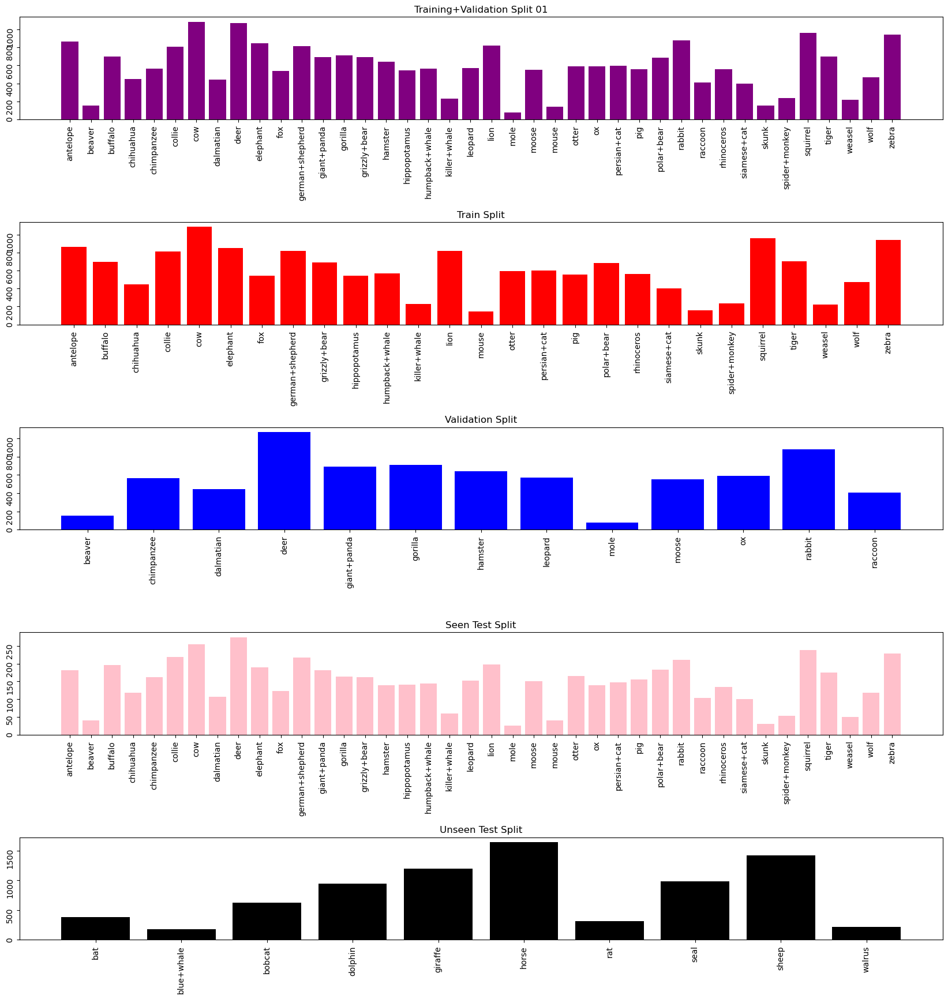

In [27]:
label_counts_trainval = collections.OrderedDict(sorted(Counter(trainval_df.classes).items()))
label_counts_train = collections.OrderedDict(sorted(Counter(train_df.classes).items()))
label_counts_val = collections.OrderedDict(sorted(Counter(val_df.classes).items()))
label_counts_seentest = collections.OrderedDict(sorted(Counter(seen_test_df.classes).items()))
label_counts_unseentest = collections.OrderedDict(sorted(Counter(unseen_test_df.classes).items()))

fig, axes = plt.subplots(5, 1, figsize=(20, 20))
axes[0].title.set_text('Training+Validation Split 01')
axes[0].bar( label_counts_trainval.keys(), label_counts_trainval.values(), color = 'purple')
axes[0].tick_params(labelrotation=90)

axes[1].title.set_text('Train Split')
axes[1].bar(label_counts_train.keys(), label_counts_train.values(), color = 'red')
axes[1].tick_params(labelrotation=90)

axes[2].title.set_text('Validation Split')
axes[2].bar(label_counts_val.keys(), label_counts_val.values(), color = 'blue')
axes[2].tick_params(labelrotation=90)


axes[3].title.set_text('Seen Test Split')
axes[3].bar(label_counts_seentest.keys(), label_counts_seentest.values(), color = 'pink')
axes[3].tick_params(labelrotation=90)


axes[4].title.set_text('Unseen Test Split')
axes[4].bar(label_counts_unseentest.keys(), label_counts_unseentest.values(), color = 'black')
axes[4].tick_params(labelrotation=90)


#set the spacing between subplots
plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9, wspace=0.1, hspace=1)

In [28]:
#Predefined Train - Validation Split 01
trainclasses1_classes_file = open("C:/Dissertation/Data/AwA2-data/Animals_with_Attributes2/Updated Splits/trainclasses1.txt", "r")
# reading the file
trainclasses1_classes_names = trainclasses1_classes_file.read()
# replacing end of line('/n') with ' ' and
trainclasses1_classes_names_list = trainclasses1_classes_names.replace('\n', ' ').split(" ")
# split in to train and val data
train01_df = trainval_df[trainval_df['classes'].isin(trainclasses1_classes_names_list)]
val01_df = trainval_df[~trainval_df['classes'].isin(trainclasses1_classes_names_list)]
# printing the data
print('\033[1m','\033[91m',"Training - Validation Split 01",'\033[0m')
print('\033[1m',"Train Classes",'\033[0m','\n', train01_df.classes.unique(),'\n')
print('\033[1m',"Validation Classes",'\033[0m','\n', val01_df.classes.unique(),'\n')


#Predefined Train - Validation Split 02
trainclasses2_classes_file = open("C:/Dissertation/Data/AwA2-data/Animals_with_Attributes2/Updated Splits/trainclasses2.txt", "r")
# reading the file
trainclasses2_classes_names = trainclasses2_classes_file.read()
# replacing end of line('/n') with ' ' and
trainclasses2_classes_names_list = trainclasses2_classes_names.replace('\n', ' ').split(" ")
# split in to train and val data
train02_df = trainval_df[trainval_df['classes'].isin(trainclasses2_classes_names_list)]
val02_df = trainval_df[~trainval_df['classes'].isin(trainclasses2_classes_names_list)]
# printing the data
print('\033[1m','\033[91m',"Training - Validation Split 02",'\033[0m')
print('\033[1m',"Train Classes",'\033[0m','\n', train02_df.classes.unique(),'\n')
print('\033[1m',"Validation Classes",'\033[0m','\n', val02_df.classes.unique(),'\n')


#Predefined Train - Validation Split 03
trainclasses3_classes_file = open("C:/Dissertation/Data/AwA2-data/Animals_with_Attributes2/Updated Splits/trainclasses3.txt", "r")
# reading the file
trainclasses3_classes_names = trainclasses3_classes_file.read()
# replacing end of line('/n') with ' ' and
trainclasses3_classes_names_list = trainclasses3_classes_names.replace('\n', ' ').split(" ")
# split in to train and val data
train03_df = trainval_df[trainval_df['classes'].isin(trainclasses3_classes_names_list)]
val03_df = trainval_df[~trainval_df['classes'].isin(trainclasses3_classes_names_list)]
# printing the data
print('\033[1m','\033[91m',"Training - Validation Split 03",'\033[0m')
print('\033[1m',"Train Classes",'\033[0m','\n', train03_df.classes.unique(),'\n')
print('\033[1m',"Validation Classes",'\033[0m','\n', val03_df.classes.unique(),'\n')

  Training - Validation Split 01 
 Train Classes  
 ['antelope' 'buffalo' 'chihuahua' 'collie' 'cow' 'elephant' 'fox'
 'german+shepherd' 'grizzly+bear' 'hippopotamus' 'humpback+whale'
 'killer+whale' 'lion' 'mouse' 'otter' 'persian+cat' 'pig' 'polar+bear'
 'rhinoceros' 'siamese+cat' 'skunk' 'spider+monkey' 'squirrel' 'tiger'
 'weasel' 'wolf' 'zebra'] 

 Validation Classes  
 ['beaver' 'chimpanzee' 'dalmatian' 'deer' 'giant+panda' 'gorilla'
 'hamster' 'leopard' 'mole' 'moose' 'ox' 'rabbit' 'raccoon'] 

  Training - Validation Split 02 
 Train Classes  
 ['buffalo' 'chimpanzee' 'collie' 'cow' 'deer' 'elephant' 'german+shepherd'
 'giant+panda' 'gorilla' 'hamster' 'hippopotamus' 'humpback+whale'
 'leopard' 'lion' 'mole' 'moose' 'mouse' 'polar+bear' 'rabbit' 'raccoon'
 'rhinoceros' 'siamese+cat' 'spider+monkey' 'squirrel' 'tiger' 'weasel'
 'wolf'] 

 Validation Classes  
 ['antelope' 'beaver' 'chihuahua' 'dalmatian' 'fox' 'grizzly+bear'
 'killer+whale' 'otter' 'ox' 'persian+cat' 'pig' 'skun

### 2.4.3 Save as csv

In [29]:
#Test split
unseen_test_df.to_csv("C:/Dissertation/Data/Processed Data/UNSEEN_TestData_KG.csv")
seen_test_df.to_csv("C:/Dissertation/Data/Processed Data/SEEN_TestData_KG.csv")

#Train
train01_df.to_csv("C:/Dissertation/Data/Processed Data/TrainData01_KG.csv")
train02_df.to_csv("C:/Dissertation/Data/Processed Data/TrainData02_KG.csv")
train03_df.to_csv("C:/Dissertation/Data/Processed Data/TrainData03_KG.csv")

#Validation
val01_df.to_csv("C:/Dissertation/Data/Processed Data/ValData01_KG.csv")
val02_df.to_csv("C:/Dissertation/Data/Processed Data/ValData02_KG.csv")
val03_df.to_csv("C:/Dissertation/Data/Processed Data/ValData03_KG.csv")

#Train+Validation data
trainval_df.to_csv("C:/Dissertation/Data/Processed Data/TrainValData_KG.csv")
train_df.to_csv("C:/Dissertation/Data/Processed Data/TrainData_KG.csv")
val_df.to_csv("C:/Dissertation/Data/Processed Data/ValData_KG.csv")

In [30]:
train01_df.iloc[:,2052:]

2    3    4    5    6    7    8    9   10   11   12   13   14   15  \
2      1.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0  1.0   
4      1.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0  1.0   
5      1.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0  1.0   
6      1.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0  1.0   
7      1.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0  1.0   
...    ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...   
37316  1.0  1.0  0.0  1.0  0.0  1.0  1.0  1.0  0.0  1.0  1.0  1.0  0.0  0.0   
37317  1.0  1.0  0.0  1.0  0.0  1.0  1.0  1.0  0.0  1.0  1.0  1.0  0.0  0.0   
37318  1.0  1.0  0.0  1.0  0.0  1.0  1.0  1.0  0.0  1.0  1.0  1.0  0.0  0.0   
37320  1.0  1.0  0.0  1.0  0.0  1.0  1.0  1.0  0.0  1.0  1.0  1.0  0.0  0.0   
37321  1.0  1.0  0.0  1.0  0.0  1.0  1.0  1.0  0.0  1.0  1.0  1.0  0.0  0.0   

        16   17   18   19   20   21   22   23   24   25   26   27   28   29  \
2      1.0  0.0  1.0  0.0  0.0  0.0  0.0  1.0  1.0  0.0  0.0  1.0  1.0  0.0   
4      1.0  0.0  1.0  0.0  0.0  0.0  0.0  1.0  1.0  0.0  0.0  1.0  1.0  0.0   
5      1.0  0.0  1.0  0.0  0.0  0.0  0.0  1.0  1.0  0.0  0.0  1.0  1.0  0.0   
6      1.0  0.0  1.0  0.0  0.0  0.0  0.0  1.0  1.0  0.0  0.0  1.0  1.0  0.0   
7      1.0  0.0  1.0  0.0  0.0  0.0  0.0  1.0  1.0  0.0  0.0  1.0  1.0  0.0   
...    ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...   
37316  1.0  0.0  1.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  0.0   
37317  1.0  0.0  1.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  0.0   
37318  1.0  0.0  1.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  0.0   
37320  1.0  0.0  1.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  0.0   
37321  1.0  0.0  1.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  0.0   

        30   31   32   33   34   35   36   37   38   39   40   41   42   43  \
2      0.0  1.0  1.0  1.0  0.0  1.0  1.0  0.0  0.0  0.0  1.0  1.0  1.0  1.0   
4      0.0  1.0  1.0  1.0  0.0  1.0  1.0  0.0  0.0  0.0  1.0  1.0  1.0  1.0   
5      0.0  1.0  1.0  1.0  0.0  1.0  1.0  0.0  0.0  0.0  1.0  1.0  1.0  1.0   
6      0.0  1.0  1.0  1.0  0.0  1.0  1.0  0.0  0.0  0.0  1.0  1.0  1.0  1.0   
7      0.0  1.0  1.0  1.0  0.0  1.0  1.0  0.0  0.0  0.0  1.0  1.0  1.0  1.0   
...    ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...   
37316  0.0  0.0  0.0  0.0  0.0  1.0  1.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0   
37317  0.0  0.0  0.0  0.0  0.0  1.0  1.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0   
37318  0.0  0.0  0.0  0.0  0.0  1.0  1.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0   
37320  0.0  0.0  0.0  0.0  0.0  1.0  1.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0   
37321  0.0  0.0  0.0  0.0  0.0  1.0  1.0  1.0  0.0  0.0  1.0  0.0  1.0  1.0   

        44   45   46   47   48   49   50   51   52   53   54   55   56   57  \
2      0.0  1.0  0.0  1.0  1.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  1.0   
4      0.0  1.0  0.0  1.0  1.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  1.0   
5      0.0  1.0  0.0  1.0  1.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  1.0   
6      0.0  1.0  0.0  1.0  1.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  1.0   
7      0.0  1.0  0.0  1.0  1.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  1.0  1.0   
...    ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...   
37316  0.0  1.0  0.0  1.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0  0.0  1.0  1.0   
37317  0.0  1.0  0.0  1.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0  0.0  1.0  1.0   
37318  0.0  1.0  0.0  1.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0  0.0  1.0  1.0   
37320  0.0  1.0  0.0  1.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0  0.0  1.0  1.0   
37321  0.0  1.0  0.0  1.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0  0.0  1.0  1.0   

        58   59   60   61   62   63   64   65   66   67   68   69   70   71  \
2      1.0  1.0  1.0  1.0  1.0  1.0  0.0  0.0  1.0  1.0  0.0  0.0  1.0  0.0   
4      1.0  1.0  1.0  1.0  1.0  1.0  0.0  0.0  1.0  1.0

# 3. Visualising classes 2D space by decomposing the attributes using T_SNE

### 3.1 Based on predicates

In [34]:
#Seperate columns 
#animal_type = pd.DataFrame(['herd herbivore', 'bear', 'whale type', 'rodent', 'dog', 'domestic cat', 'horse', 'dog', 'whale type', 'domestic cat',  'rodent', 'rodent', 'wild cat', 'wild Africa', 'wild cat', 'herd herbivore', 'monkey', 'whale type', 'wild Africa', 'monkey', 'cow type', 'wild dog', 'herd herbivore', 'sea dog' , 'monkey', 'rodent', 'rodent', 'wild Africa', 'rodent', 'rodent', 'wild Africa', 'wild dog', 'dog', 'rodent', 'rodent', 'rodent', 'cow type', 'herd herbivore', 'bear', 'herd herbivore', 'wild cat', 'pig' , 'wild cat', 'rodent', 'bear', 'dog', 'sea dog' , 'rodent', 'cow type', 'whale type'], columns = ['animal type'])
labels = predicate_df['classes']
binary_attributes = predicate_df.iloc[:,2:87]
continous_attributes = StandardScaler().fit_transform(predicate_df.iloc[:,87:172])

In [35]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=26, random_state=0)
kmeans.fit(continous_attributes)
clusters = kmeans.predict(continous_attributes)
clusters_df = pd.DataFrame(data = clusters
             , columns = ['K_mean'])

In [37]:
#Binary
tsne = TSNE(n_components=2, verbose=1, random_state=123)
tsne_binary = tsne.fit_transform(binary_attributes) 
tsne_binary_df = pd.DataFrame(data = tsne_binary
             , columns = ['Binary comp-1', 'Binary comp-2'])

#Continous
tsne_continous= tsne.fit_transform(continous_attributes) 
tsne_continous_df = pd.DataFrame(data = tsne_continous
             , columns = ['Continous comp-1', 'Continous comp-2'])

#concat
tsne_binary_df1 = pd.concat([tsne_binary_df, labels], axis = 1)
tsne_continous_df1 = pd.concat([tsne_continous_df, labels], axis = 1)
tsne_continous_df1 = pd.concat([tsne_continous_df1, taxonomy_df['order']], axis = 1)
tsne_continous_df1 = pd.concat([tsne_continous_df1, taxonomy_df['family']], axis = 1)
tsne_continous_df1 = pd.concat([tsne_continous_df1, clusters_df['K_mean']], axis = 1)

C:\Users\Abhimanyu Acharya\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\Abhimanyu Acharya\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(
C:\Users\Abhimanyu Acharya\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(


[t-SNE] Computing 49 nearest neighbors...
[t-SNE] Indexed 50 samples in 0.000s...
[t-SNE] Computed neighbors for 50 samples in 0.002s...
[t-SNE] Computed conditional probabilities for sample 50 / 50
[t-SNE] Mean sigma: 2.709490
[t-SNE] KL divergence after 250 iterations with early exaggeration: 52.068138
[t-SNE] KL divergence after 1000 iterations: 0.243984
[t-SNE] Computing 49 nearest neighbors...
[t-SNE] Indexed 50 samples in 0.016s...


C:\Users\Abhimanyu Acharya\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computed neighbors for 50 samples in 0.002s...
[t-SNE] Computed conditional probabilities for sample 50 / 50
[t-SNE] Mean sigma: 6.949333
[t-SNE] KL divergence after 250 iterations with early exaggeration: 50.479012
[t-SNE] KL divergence after 1000 iterations: 0.353672


In [38]:
source = tsne_continous_df1

points = alt.Chart(source).mark_circle(size=200).encode(
    x='Continous comp-1:Q',
    y='Continous comp-2:Q',
    color=alt.Color('K_mean:N', scale=alt.Scale(scheme='Spectral')),
    ).properties(
    width=800,
    height=800
)

text1 = points.mark_text(
    align='left',
    baseline='middle',
    dx=7
).encode(
    text='classes:N'
)

text2 = points.mark_text(
    align='right',
    baseline='middle',
    dx=-10
).encode(
    text='K_mean:N'
)

points.interactive() + text1 + text2

alt.LayerChart(...)

In [ ]:
source = tsne_continous_df1

points = alt.Chart(source).mark_circle(size=200).encode(
    x='Continous comp-1:Q',
    y='Continous comp-2:Q',
    color=alt.Color('family:N', scale=alt.Scale(scheme='Spectral')),
    ).properties(
    width=800,
    height=800
)

text = points.mark_text(
    align='left',
    baseline='middle',
    dx=7
).encode(
    text='classes:N'
)

points.interactive() + text

### 3.2 Based on CNN features

In [ ]:
#Seperate columns 
cnn_labels = unseen_test_df['classes']
cnn_labels.reset_index(drop=True, inplace=True)
cnn_features = unseen_test_df.iloc[:,1:2049]

In [ ]:
tsne = TSNE(n_components=2, verbose=1, random_state=123)
tsne_cnn_features = tsne.fit_transform(cnn_features) 
tsne_cnn_features_df = pd.DataFrame(data = tsne_cnn_features
             , columns = ['comp-1', 'comp-2'])

In [ ]:
tsne_cnn_features_df = pd.concat([tsne_cnn_features_df, cnn_labels], axis = 1)
tsne_cnn_features_df.head()

In [ ]:
alt.data_transformers.disable_max_rows()
source = tsne_cnn_features_df

points = alt.Chart(source).mark_circle(size=50).encode(
    x='comp-1:Q',
    y='comp-2:Q',
    color='classes:N',
    ).properties(
    width=800,
    height=800
)

text = points.mark_text(
    align='left',
    baseline='middle',
    dx=2
).encode(
    text='classes:N'
)

points.interactive() 

In [ ]:
#Seperate columns 
cnn_labels_full = ImageAttribute_df['classes']
cnn_labels_full.reset_index(drop=True, inplace=True)
cnn_features_full = ImageAttribute_df.iloc[:,1:2049]

In [ ]:
tsne = TSNE(n_components=2, verbose=1, random_state=123)
tsne_cnn_features_full = tsne.fit_transform(cnn_features_full) 
tsne_cnn_features_full_df = pd.DataFrame(data = tsne_cnn_features_full
             , columns = ['comp-1', 'comp-2'])

In [ ]:
tsne_cnn_features_full_df = pd.concat([tsne_cnn_features_full_df, cnn_labels_full], axis = 1)
tsne_cnn_features_full_df.head()

In [ ]:
alt.data_transformers.disable_max_rows()
source = tsne_cnn_features_full_df

points = alt.Chart(source).mark_circle(size=50).encode(
    x='comp-1:Q',
    y='comp-2:Q',
    color='classes:N',
    ).properties(
    width=800,
    height=800
)

text = points.mark_text(
    align='left',
    baseline='middle',
    dx=2
).encode(
    text='classes:N'
)

points.interactive()